<div style="background-color: #eee3d3">
<h1> 2-explore_data.ipynb </h1>
</div>

# Exploratory data analysis

---

### The aim of this notebook is to explore the peak table cleaned in the previous notebook (1-clean_RPpos_peakTable) with a few visualisations on target (here the Sample Group), missing values, distributions, ...

### Basic ckecklist :

#### Form analysis :
- __target__ : Groups
- __shape (rows & columns)__ : 186 rows (samples) x 337 columns (8 for metadata and 329 compounds)
- __features types__ :
    - metadata :
        - qualitative : 7 (SampleID, Groups, TypTumo, CaseHCCWide, EPICID, EPICBioID, AliquotID)
        - quantitative (int) : 1 (MatchCaseset)
    - variables (compounds and their adducts) :    
        - quantitative (float) : 329 (compounds)
- __missing values__ :
    - compounds can be in every sample (0% of missing values), in most of them or just in a few
    - the maximum of missing value for a variable is 49.5%, i.e. this variable is absent from 49.5% of the samples
    - (samples seem to be more easily separated with not too much missing values (logic))

#### Content analysis :
- __target visualisation__ :
    - ratio 1:1 (93 Cancer - 93 Healthy)
- __feature visualisation__ :
    - on the first 10 compounds, most of them follow a normal distribution
    - some of them follow a double normal distribution
    - maybe one distribution for each class (Healthy vs Cancer) --> hypothesis
- __relation features/target__ :
    - on the first 10 compounds, we don't see a clear difference of intensity between the Cancer and Healthy samples --> previous hypothesis rejected on these compounds --> may be true of others
- __relation features/features__ : strong correlations between some of the features --> need to reduce the dimension for further analysis

# Import modules

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import scipy

import plotly.express as px
from sklearn.decomposition import PCA

import cimcb_lite as cb

In [2]:
# Tune the visual settings for figures in seaborn
sns.set_context(
    "notebook", font_scale=1.2, rc={"figure.figsize": (8, 6), "axes.titlesize": 15}
)

from matplotlib import rcParams

rcParams["figure.figsize"] = 8, 6

sns.set_theme(style="darkgrid")

# Import useful functions

In [3]:
import re
pwd = ! pwd
pwd = re.sub('notebooks', '', pwd[0])
print(f'Working directory : {pwd}')

import sys
sys.path.append(pwd + 'bin/')

from explore_data_functions import *

Working directory : /home/jovyan/work/


# Import peak table formated in previous notebooks, and create variable X (peakTable without metadata columns)

In [4]:
peakTable = pd.read_csv(pwd + 'data/prepare_HCC_data/usable_peakTables/peakTable_metaboigniter_and_metadata_remove_corr.csv',
                        sep=',', decimal='.', na_values='NA')
peakTable.head()

,country,Center,Idepic_Bio,Idepic_Samp,Id_Bma,Id Aliquot,CaseCtrl,ID_split_HCC,Idepic,Match_Caseset,...,variable_2326,variable_2328,variable_2329,variable_2332,variable_2339,variable_2340,variable_2350,variable_2364,variable_2365,variable_2370
0,4.0,41.0,41____41041872,41041872-s2#C1,41-LivCan_153,41041872-s2#C,Incident,41041872.0,41____41041872,82.0,...,13.194216,12.885181,NaN,13.330208,12.052252,12.568647,13.192848,12.248590,12.114328,12.355017
1,4.0,41.0,41____41046868,41046868-s2#C1,41-LivCan_154,41046868-s2#C,Non-case,41046868.0,41____41046868,82.0,...,12.700734,12.742979,11.929552,13.464403,13.020365,12.928643,13.697314,12.604052,NaN,12.208084
2,4.0,41.0,41____41074588,41074588-s1#B1,41-LivCan_267,41074588-s1#B,Incident,41074588.0,41____41074588,427.0,...,12.618229,12.485436,11.709115,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4.0,41.0,41____41089214,41089214-s1#B1,41-LivCan_268,41089214-s1#B,Non-case,41089214.0,41____41089214,427.0,...,12.720631,12.564338,NaN,13.397322,NaN,NaN,13.086805,NaN,11.605353,12.319119
4,2.0,21.0,21____21103888,21103888-s1#B1,21-LivCan_299,21103888-s1#B,Incident,21103888.0,21____21103888,376.0,...,12.564943,12.344968,12.127879,NaN,NaN,NaN,NaN,12.349830,11.926237,NaN


In [5]:
peakTable.shape

(186, 1280)

The peak table contains 186 rows (samples), 1280 columns :

In [6]:
X = peakTable.iloc[:, ['variable_' in col for col in peakTable.columns]]
X.head()

,variable_3,variable_5,variable_6,variable_8,variable_10,variable_11,variable_14,variable_22,variable_23,variable_25,...,variable_2326,variable_2328,variable_2329,variable_2332,variable_2339,variable_2340,variable_2350,variable_2364,variable_2365,variable_2370
0,19.761786,14.635833,22.185582,12.615143,15.580604,15.881437,17.500899,12.792893,16.805604,16.805842,...,13.194216,12.885181,NaN,13.330208,12.052252,12.568647,13.192848,12.248590,12.114328,12.355017
1,19.735279,15.193396,20.831414,NaN,15.145423,14.034654,17.953780,NaN,15.907714,14.977232,...,12.700734,12.742979,11.929552,13.464403,13.020365,12.928643,13.697314,12.604052,NaN,12.208084
2,19.116076,15.446714,22.152604,NaN,14.628890,15.316772,17.404715,12.786407,15.947176,16.238502,...,12.618229,12.485436,11.709115,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,19.376875,15.460525,22.169389,12.720767,15.937169,15.967749,15.836957,NaN,16.371211,17.052231,...,12.720631,12.564338,NaN,13.397322,NaN,NaN,13.086805,NaN,11.605353,12.319119
4,19.555938,14.515536,22.150249,12.314019,14.950203,15.294906,16.610171,12.214057,16.171763,16.107590,...,12.564943,12.344968,12.127879,NaN,NaN,NaN,NaN,12.349830,11.926237,NaN


In [7]:
X.shape

(186, 337)

337 columns are variables/features from metaboigniter output

In [8]:
metadata = peakTable.drop(X.columns, axis=1)
metadata.head()

,country,Center,Idepic_Bio,Idepic_Samp,Id_Bma,Id Aliquot,CaseCtrl,ID_split_HCC,Idepic,Match_Caseset,...,fast_st1,logtg1,logtgnew1,tgnew1,elevated_tg1,point,point2,point3,bart,ast_alt
0,4.0,41.0,41____41041872,41041872-s2#C1,41-LivCan_153,41041872-s2#C,Incident,41041872.0,41____41041872,82.0,...,0.0,1.754415,1.404415,4.073144,1.0,1.0,0.0,1.0,2.0,1.158730
1,4.0,41.0,41____41046868,41046868-s2#C1,41-LivCan_154,41046868-s2#C,Non-case,41046868.0,41____41046868,82.0,...,0.0,-0.038618,-0.388618,0.677993,0.0,1.0,0.0,0.0,1.0,1.000000
2,4.0,41.0,41____41074588,41074588-s1#B1,41-LivCan_267,41074588-s1#B,Incident,41074588.0,41____41074588,427.0,...,1.0,1.284089,NaN,3.611377,1.0,0.0,2.0,0.0,2.0,0.857418
3,4.0,41.0,41____41089214,41089214-s1#B1,41-LivCan_268,41089214-s1#B,Non-case,41089214.0,41____41089214,427.0,...,0.0,1.053347,0.863347,2.371083,1.0,0.0,2.0,1.0,3.0,0.837792
4,2.0,21.0,21____21103888,21103888-s1#B1,21-LivCan_299,21103888-s1#B,Incident,21103888.0,21____21103888,376.0,...,1.0,0.009881,NaN,1.009930,0.0,0.0,2.0,0.0,2.0,1.134635


and 943 columns for metadata

# Import explanation on metadata 

In [54]:
metadata_explanation = pd.read_csv(pwd + 'data/prepare_HCC_data/Data_Dict_Live_Caco.csv',
                        sep=',', decimal='.', na_values='NA')
print(metadata_explanation.shape)
metadata_explanation.head(10)

(802, 8)


,#,Variable,Label,Type,Length,Format,Value code,Value label
0,114.0,A_1_Ftp,Age at first full term pregnancy,Num,8.0,3.,NaN,NaN
1,103.0,A_1_Per_Aggr,Age at first menstrual period (aggregated),Num,8.0,3.,NaN,NaN
2,113.0,A_1_Pregnancy,Age at first of all pregnancy,Num,8.0,3.,NaN,NaN
3,63.0,A_Gallst,Age gallstones,Num,8.0,2.,NaN,NaN
4,86.0,A_Giv_Cig_Aggr,Age give up smoking cigarettes (aggregated),Num,8.0,3.,NaN,NaN
5,85.0,A_Giv_Smok_Aggr,Age give up smoking (aggregated),Num,8.0,3.,NaN,NaN
6,59.0,A_Hyperl,Age hyperlipidaemia (high blood lipids),Num,8.0,2.,NaN,NaN
7,56.0,A_Hypert,Age hypertension (high blood pressure),Num,8.0,2.,NaN,NaN
8,115.0,A_Menopause,Age at menopause,Num,8.0,3.,NaN,NaN
9,105.0,A_Pill_Aggr,Age when you started using the pill (aggregated),Num,8.0,3.,NaN,NaN


# Form analysis

### Features types - corresponding to biological features

In [9]:
X.dtypes.value_counts()

float64    337
dtype: int64

All variables are float

### Features types - corresponding to metadata

In [10]:
metadata.dtypes.value_counts()

float64    836
object     101
int64        6
dtype: int64

In [11]:
metadata.dtypes[peakTable.dtypes == 'int64']

Country    int64
Cntr_A     int64
Cntr_B     int64
Cntr_C     int64
Cntr_D     int64
Cntr_E     int64
dtype: object

In [12]:
metadata.dtypes[peakTable.dtypes == 'object']

Idepic_Bio      object
Idepic_Samp     object
Id_Bma          object
Id Aliquot      object
CaseCtrl        object
                 ...  
Gallst          object
T_Gallst        object
D_Bld_Pres      object
Tec_Bld_Pres    object
Bld_Pres        object
Length: 101, dtype: object

In [13]:
metadata.dtypes[peakTable.dtypes == 'float64']

country          float64
Center           float64
ID_split_HCC     float64
Match_Caseset    float64
A_Imputation_    float64
                  ...   
point            float64
point2           float64
point3           float64
bart             float64
ast_alt          float64
Length: 836, dtype: object

## Balance in target feature (Case/Incident vs. Control/Non-case)

In [14]:
peakTable['CaseCtrl'].value_counts()

Incident    93
Non-case    93
Name: CaseCtrl, dtype: int64

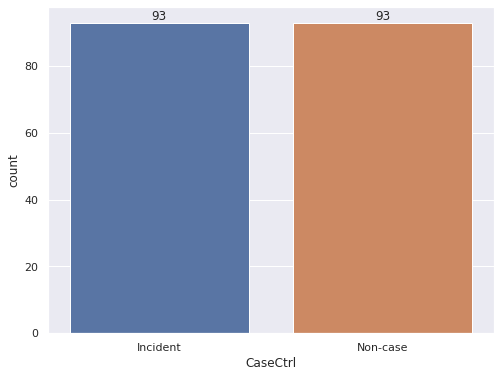

In [15]:
ax = sns.countplot(x='CaseCtrl', data=peakTable);
ax.bar_label(ax.containers[0]);

#### Ratio 1:1 between Healthy and Cancer patients --> samples go in pairs, in metadata we have the pair number for each sample

## Heatmap of missing value

This representation enables to see the global distribution of missing values (black dots) across the peak table.

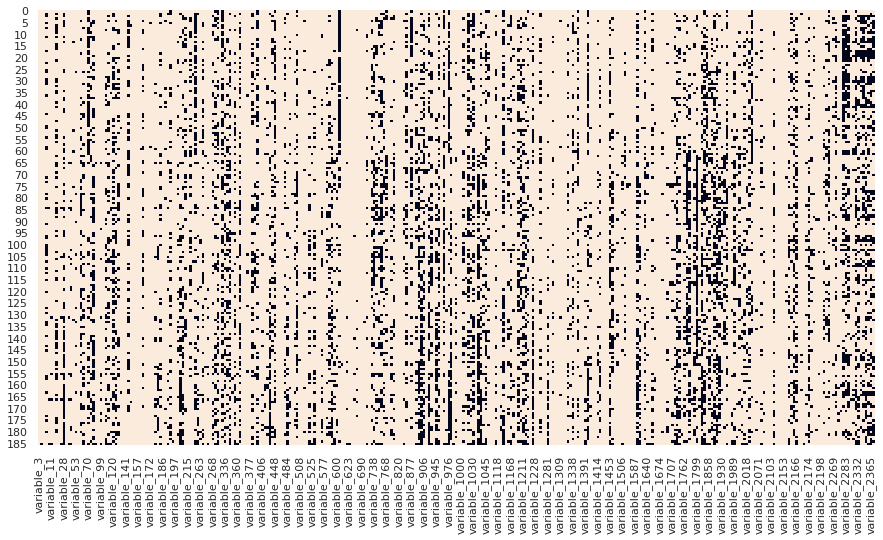

In [16]:
plt.figure(figsize=(15,8))
sns.heatmap(X.notna(), cbar=False);

In [17]:
X.isna()

,variable_3,variable_5,variable_6,variable_8,variable_10,variable_11,variable_14,variable_22,variable_23,variable_25,...,variable_2326,variable_2328,variable_2329,variable_2332,variable_2339,variable_2340,variable_2350,variable_2364,variable_2365,variable_2370
0,False,False,False,False,False,False,False,False,False,False,...,False,False,True,False,False,False,False,False,False,False
1,False,False,False,True,False,False,False,True,False,False,...,False,False,False,False,False,False,False,False,True,False
2,False,False,False,True,False,False,False,False,False,False,...,False,False,False,True,True,True,True,True,True,True
3,False,False,False,False,False,False,False,True,False,False,...,False,False,True,False,True,True,False,True,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,True,True,True,True,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181,False,False,False,False,False,False,False,False,False,False,...,True,False,True,False,False,False,False,True,True,True
182,False,False,False,False,False,False,False,False,False,False,...,False,False,False,True,False,False,True,False,False,False
183,False,False,False,False,False,False,False,False,False,False,...,False,True,False,False,False,False,True,False,True,False
184,False,False,False,False,False,False,False,False,False,False,...,False,False,True,True,False,False,True,False,True,True


In [18]:
perc_mv = X.isna().sum() / X.shape[0]
perc_mv

variable_3       0.000000
variable_5       0.005376
variable_6       0.000000
variable_8       0.268817
variable_10      0.016129
                   ...   
variable_2340    0.370968
variable_2350    0.387097
variable_2364    0.354839
variable_2365    0.413978
variable_2370    0.360215
Length: 337, dtype: float64

In [19]:
perc_mv.max()

0.4946236559139785

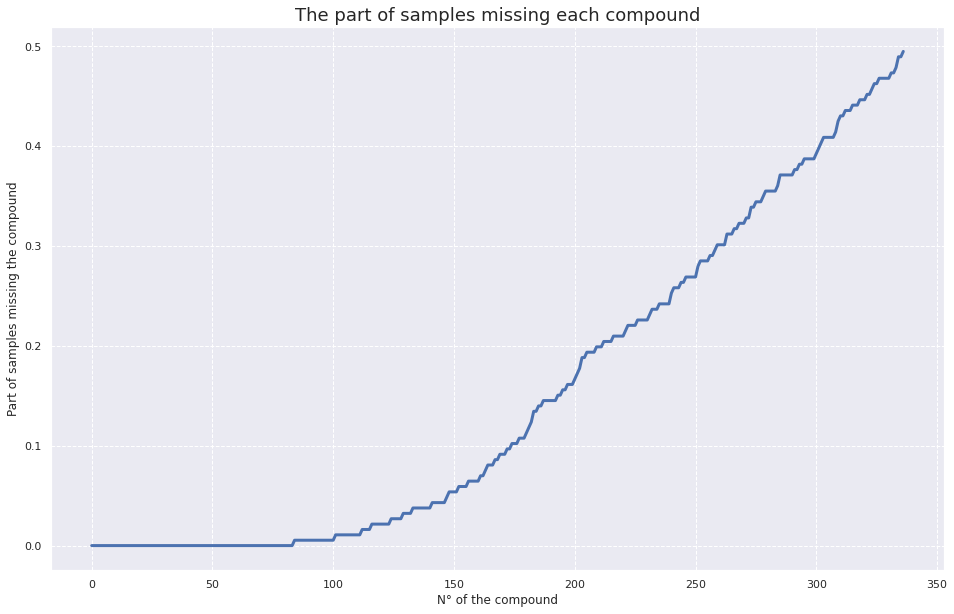

In [20]:
plt.figure(figsize=(16,10))
plt.plot(perc_mv.sort_values().values, color='b', linewidth=3)
plt.xlabel('N° of the compound', fontsize=12)
plt.ylabel('Part of samples missing the compound', fontsize=12)
plt.title('The part of samples missing each compound', fontsize=18)
plt.grid(linestyle='--', linewidth=1)
plt.show()

## Plot a first PCA

In [21]:
X_ = X.copy()

In [22]:
X_[X_.isna()] = 1

In [23]:
X_

,variable_3,variable_5,variable_6,variable_8,variable_10,variable_11,variable_14,variable_22,variable_23,variable_25,...,variable_2326,variable_2328,variable_2329,variable_2332,variable_2339,variable_2340,variable_2350,variable_2364,variable_2365,variable_2370
0,19.761786,14.635833,22.185582,12.615143,15.580604,15.881437,17.500899,12.792893,16.805604,16.805842,...,13.194216,12.885181,1.000000,13.330208,12.052252,12.568647,13.192848,12.248590,12.114328,12.355017
1,19.735279,15.193396,20.831414,1.000000,15.145423,14.034654,17.953780,1.000000,15.907714,14.977232,...,12.700734,12.742979,11.929552,13.464403,13.020365,12.928643,13.697314,12.604052,1.000000,12.208084
2,19.116076,15.446714,22.152604,1.000000,14.628890,15.316772,17.404715,12.786407,15.947176,16.238502,...,12.618229,12.485436,11.709115,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
3,19.376875,15.460525,22.169389,12.720767,15.937169,15.967749,15.836957,1.000000,16.371211,17.052231,...,12.720631,12.564338,1.000000,13.397322,1.000000,1.000000,13.086805,1.000000,11.605353,12.319119
4,19.555938,14.515536,22.150249,12.314019,14.950203,15.294906,16.610171,12.214057,16.171763,16.107590,...,12.564943,12.344968,12.127879,1.000000,1.000000,1.000000,1.000000,12.349830,11.926237,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181,19.664978,14.447858,20.808503,12.648327,14.806952,14.244917,17.126579,12.080710,15.388376,15.352711,...,1.000000,12.125251,1.000000,12.686218,12.349299,11.505004,13.189121,1.000000,1.000000,1.000000
182,19.301954,14.839941,21.085175,12.510670,14.488147,15.163197,16.816591,12.452644,16.474456,15.953391,...,13.428278,12.629126,12.360380,1.000000,12.909283,12.642143,1.000000,12.708850,12.462751,12.635066
183,19.170626,14.291711,21.381912,12.499558,14.434959,14.520558,16.315887,12.808417,15.613263,15.522875,...,13.213899,1.000000,11.870228,12.680070,12.846355,13.243400,1.000000,12.199647,1.000000,12.258149
184,18.869505,14.440576,20.961485,12.312338,14.114074,13.776358,16.110117,12.667428,16.021372,14.859646,...,12.442173,12.291946,1.000000,1.000000,12.477753,11.789382,1.000000,11.628154,1.000000,1.000000


In [24]:
cb.plot.pca(X_, pcx=1, pcy=2, group_label=peakTable['CaseCtrl'])

Loading BokehJS ...

In [25]:
cb.plot.pca(X_, pcx=1, pcy=3, group_label=peakTable['CaseCtrl'])

Loading BokehJS ...

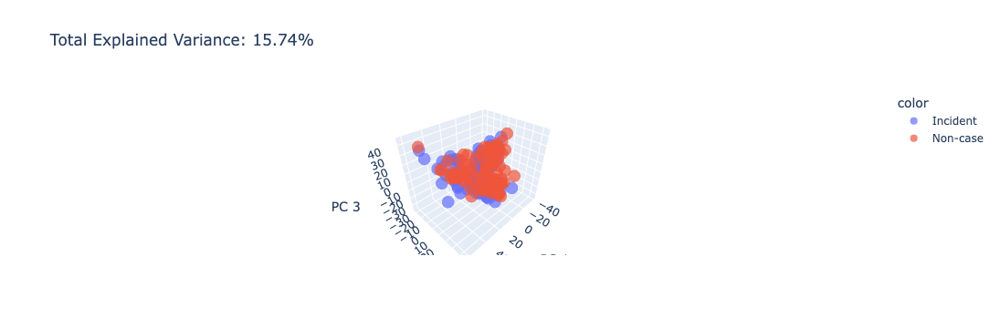

In [26]:
PCA_3D(X_, peakTable, col_group='CaseCtrl')

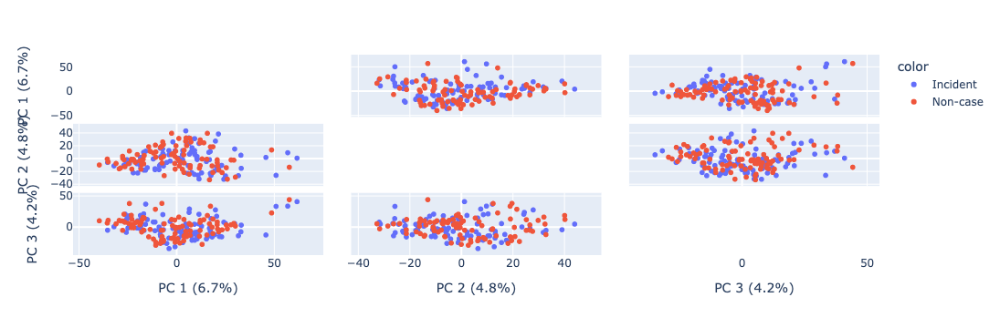

In [28]:
PCA_paired(X_, peakTable, col_group='CaseCtrl')

# Content analysis

## Target visualisation

In [29]:
peakTable['CaseCtrl'].value_counts()

Incident    93
Non-case    93
Name: CaseCtrl, dtype: int64

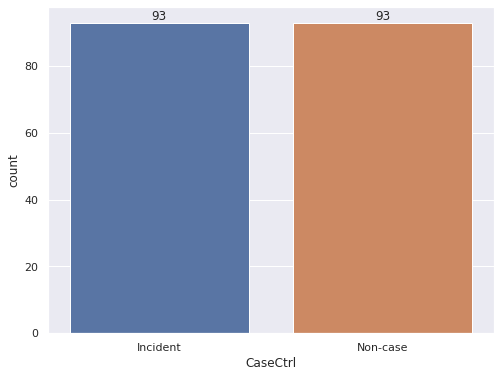

In [30]:
ax = sns.countplot(x='CaseCtrl', data=peakTable);
ax.bar_label(ax.containers[0]);

Ratio 1:1, each patient has a matched control

## Metadata visualisation

In [32]:
metadata.head()

,country,Center,Idepic_Bio,Idepic_Samp,Id_Bma,Id Aliquot,CaseCtrl,ID_split_HCC,Idepic,Match_Caseset,...,fast_st1,logtg1,logtgnew1,tgnew1,elevated_tg1,point,point2,point3,bart,ast_alt
0,4.0,41.0,41____41041872,41041872-s2#C1,41-LivCan_153,41041872-s2#C,Incident,41041872.0,41____41041872,82.0,...,0.0,1.754415,1.404415,4.073144,1.0,1.0,0.0,1.0,2.0,1.158730
1,4.0,41.0,41____41046868,41046868-s2#C1,41-LivCan_154,41046868-s2#C,Non-case,41046868.0,41____41046868,82.0,...,0.0,-0.038618,-0.388618,0.677993,0.0,1.0,0.0,0.0,1.0,1.000000
2,4.0,41.0,41____41074588,41074588-s1#B1,41-LivCan_267,41074588-s1#B,Incident,41074588.0,41____41074588,427.0,...,1.0,1.284089,NaN,3.611377,1.0,0.0,2.0,0.0,2.0,0.857418
3,4.0,41.0,41____41089214,41089214-s1#B1,41-LivCan_268,41089214-s1#B,Non-case,41089214.0,41____41089214,427.0,...,0.0,1.053347,0.863347,2.371083,1.0,0.0,2.0,1.0,3.0,0.837792
4,2.0,21.0,21____21103888,21103888-s1#B1,21-LivCan_299,21103888-s1#B,Incident,21103888.0,21____21103888,376.0,...,1.0,0.009881,NaN,1.009930,0.0,0.0,2.0,0.0,2.0,1.134635


### Qualitative metadata - number of unique values for each of feature

In [33]:
metadata.dtypes[metadata.dtypes == 'object']

Idepic_Bio      object
Idepic_Samp     object
Id_Bma          object
Id Aliquot      object
CaseCtrl        object
                 ...  
Gallst          object
T_Gallst        object
D_Bld_Pres      object
Tec_Bld_Pres    object
Bld_Pres        object
Length: 101, dtype: object

Case_AOV            1
Case_IBD            1
Case_Gallblad       1
Why_Del             1
Case_CCA_Intra      1
                 ... 
Id Aliquot        186
Id_Bma            186
Idepic_Samp       186
Idepic            186
Idepic_Bio        186
Length: 101, dtype: int64

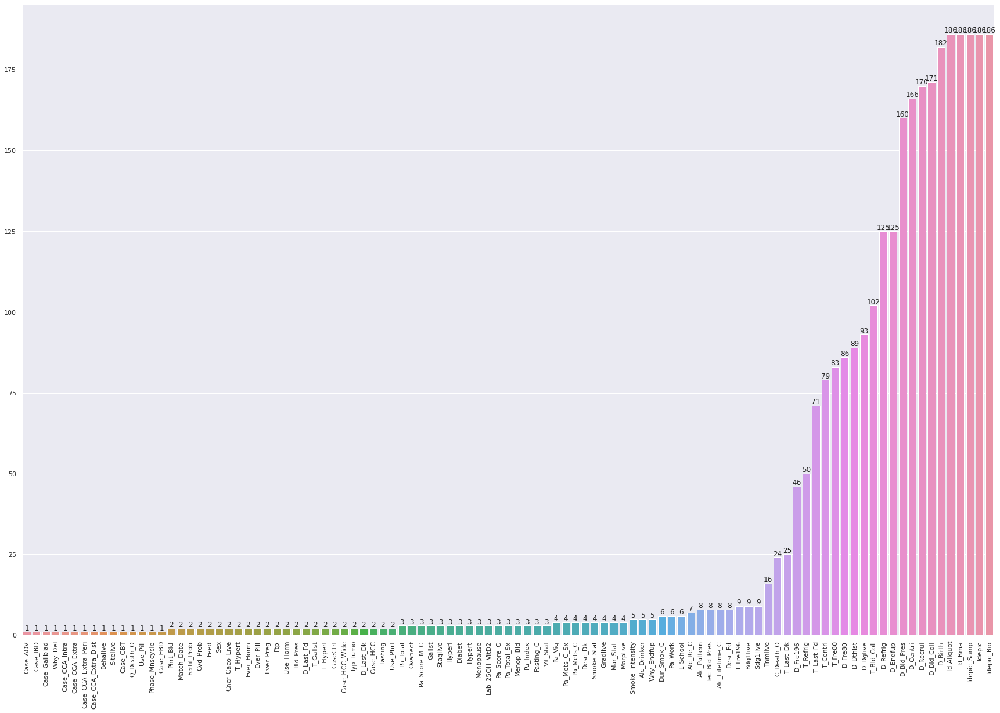

In [80]:
unique_values_quali = metadata[metadata.dtypes[metadata.dtypes == 'object'].index].nunique().sort_values()

plt.figure(figsize=(30, 20))
ax = sns.barplot(x=unique_values_quali.index, y=unique_values_quali.values);
plt.xticks(rotation=90)
ax.bar_label(ax.containers[0]);

unique_values_quali

### We can already see that some qualitative metadata columns have only one category, displayed below

In [81]:
unique_values_quali[unique_values_quali == 1].index.tolist()

['Case_AOV',
 'Case_IBD',
 'Case_Gallblad',
 'Why_Del',
 'Case_CCA_Intra',
 'Case_CCA_Extra',
 'Case_CCA_Extra_Peri',
 'Case_CCA_Extra_Dist',
 'Behalive',
 'Sitelive',
 'Case_GBT',
 'Q_Death_O',
 'Use_Pill',
 'Phase_Mnscycle',
 'Case_EBD']

In [82]:
metadata['Behalive']

0      Malignan
1           NaN
2      Malignan
3           NaN
4      Malignan
         ...   
181         NaN
182    Malignan
183         NaN
184    Malignan
185         NaN
Name: Behalive, Length: 186, dtype: object

### We can see that the column above *Behalive* contains only one category but also has NaNs so this type of column is still relevant

In [83]:
print(len(unique_values_quali.index.tolist()))
unique_values_quali.index.tolist()[:10]

101


['Case_AOV',
 'Case_IBD',
 'Case_Gallblad',
 'Why_Del',
 'Case_CCA_Intra',
 'Case_CCA_Extra',
 'Case_CCA_Extra_Peri',
 'Case_CCA_Extra_Dist',
 'Behalive',
 'Sitelive']

### There are 101 qualitative columns in metadata, we can dig a bit in some interesting ones :
- A_Menopause : Age at menopause
- Age_Blood : Age at blood collection
- Alc_Age_Start : Age started drinking alcohol


- Typ_Tumo : Classification of the tumour

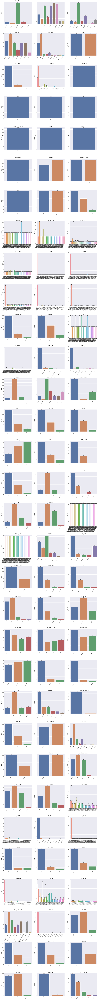

In [164]:
df_to_plot = metadata_explanation[metadata_explanation['Variable'].isin(unique_values_quali.index)]
df_to_plot.index = range(df_to_plot.shape[0])


Tot = df_to_plot.shape[0]
Cols = 3

# Compute Rows required
Rows = Tot // Cols
Rows += Tot % Cols

# Create a Position index
Position = range(1,Tot + 1)

# Create subplot
fig = plt.figure(figsize=(8 * Cols, 8 * Rows))
plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.2, 
                    hspace=0.4)


for k in range(df_to_plot.shape[0]):
    
    curr_var = df_to_plot.loc[k, 'Variable']
    
    ax = fig.add_subplot(Rows,Cols,Position[k])
    sns.countplot(x=curr_var, data=metadata.fillna('NaN'));
    ax.set_xticklabels(ax.get_xticklabels(), rotation=60, horizontalalignment='right')
    ax.set_title(curr_var, fontsize=18)
    ax.set_xlabel('')
    ax.bar_label(ax.containers[0], fmt='%.0f');
    
        
plt.show()

In [178]:
def countplots_all_columns(list_variables, metadata_explanation, max_plots=len(list_variables)):
    
    nb_variables = len(list_variables)
    nb_cols = 3

    # Compute Rows required
    nb_rows = nb_variables // nb_cols
    nb_rows += nb_variables % nb_cols

    # Create a Position index
    position = range(1, nb_variables + 1)

    # Create subplot
    fig = plt.figure(figsize=(8 * nb_cols, 8 * nb_rows))
    plt.subplots_adjust(left=0.1,
                        bottom=0.1, 
                        right=0.9, 
                        top=0.9, 
                        wspace=0.2, 
                        hspace=0.4)


    for k in range(nb_variables):

        curr_var = list_variables[k]

        ax = fig.add_subplot(nb_rows, nb_cols, position[k])
        sns.countplot(x=curr_var, data=metadata.fillna('NaN'));
        ax.set_xticklabels(ax.get_xticklabels(), rotation=60, horizontalalignment='right')
        ax.set_title(curr_var, fontsize=18)
        ax.set_xlabel('')
        ax.bar_label(ax.containers[0], fmt='%.0f');

        if k==max_plots:
            break

    plt.show()

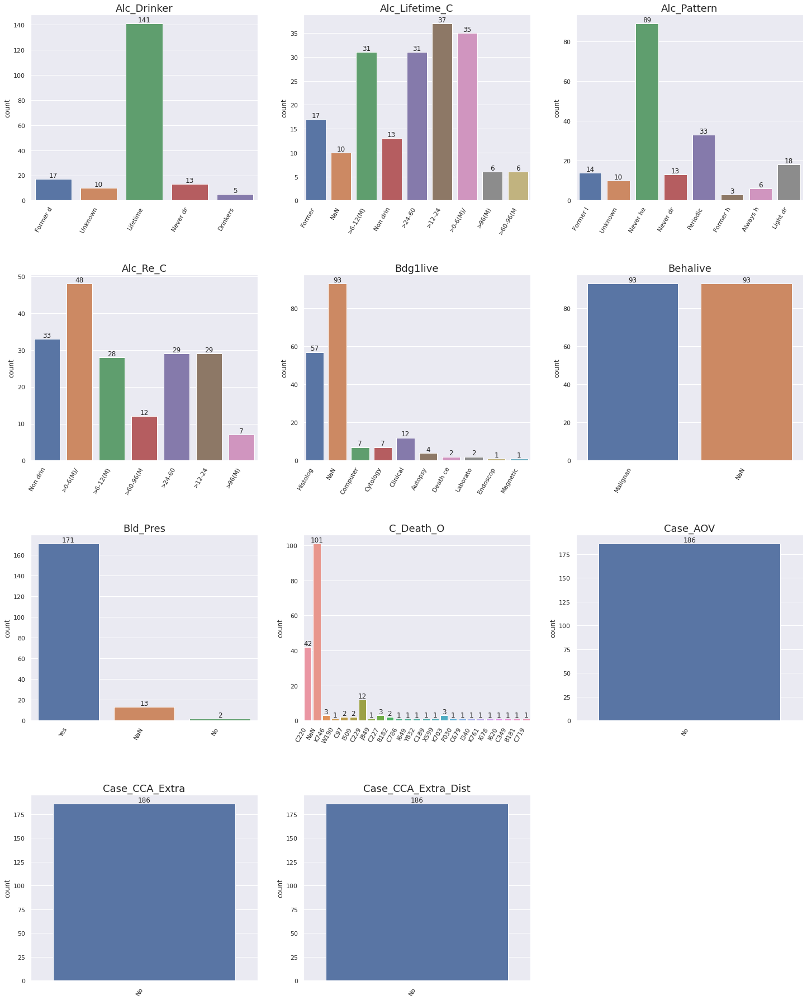

In [179]:
list_variables = metadata_explanation[metadata_explanation['Variable'].isin(unique_values_quali.index)]['Variable'].values
countplots_all_columns(list_variables=list_variables, metadata_explanation=metadata, max_plots=10)

In [94]:
max_rows_default = pd.options.display.max_rows

pd.options.display.max_rows = metadata_explanation[metadata_explanation['Variable'].isin(unique_values_quali.index)].shape[0]
display(metadata_explanation[metadata_explanation['Variable'].isin(unique_values_quali.index)])

pd.options.display.max_rows = max_rows_default


,#,Variable,Label,Type,Length,Format,Value code,Value label
39,191.0,Alc_Drinker,Alcohol drinking history,Num,8.0,ALC_DRINKER.,0,Never drinkers
56,193.0,Alc_Lifetime_C,Alcohol average lifetime intake (categ.),Num,8.0,ALC_INTAKE_C.,0,Non drinker
67,194.0,Alc_Pattern,Alcohol lifetime pattern,Num,8.0,ALC_PATTERN.,0,Never drinkers
76,192.0,Alc_Re_C,Alcohol at recruitment (categ.),Num,8.0,ALC_INTAKE_C.,0,Non drinker
97,19.0,Bdg1live,Basis of cancer diagnosis 1,Num,8.0,B_DGCNCR.,1,Self-report
118,15.0,Behalive,Behaviour of the tumour,Num,8.0,ICDO2_B.,0,Benign
124,292.0,Bld_Pres,Undergone blood pressure exam,Num,8.0,YES_NO.,0,No
128,11.0,C_Death_O,Originating cause of death,Char,4.0,$ICD10_D.,-410,Acute myocardial infarction (icd9*)
160,32.0,Case_AOV,Ampulla of Vater,Num,8.0,YES_NO.,0,No
162,34.0,Case_CCA_Extra,Extrahepatic cholangiocarcinoma,Num,8.0,YES_NO.,0,No


### Below are the variables we have in the metadata but are not in the metadata explanations

In [63]:
list(set(unique_values.index.tolist()) \
     - set(metadata_explanation[metadata_explanation['Variable'].isin(unique_values.index.tolist())]['Variable'].values))

['Id_Bma', 'Id Aliquot', 'Idepic_Samp', 'Lab_25OH_VitD2', 'CaseCtrl']

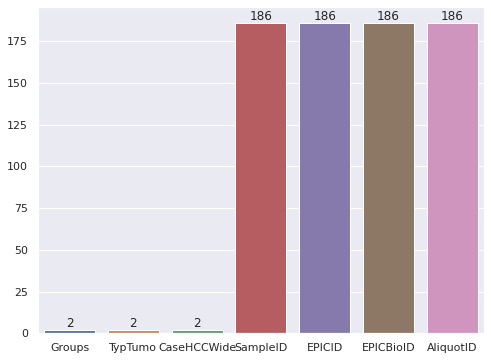

In [30]:
unique_values = peakTable[peakTable.dtypes[peakTable.dtypes == 'object'].index].nunique().sort_values()

ax = sns.barplot(x=unique_values.index, y=unique_values.values);
ax.bar_label(ax.containers[0]);

### TypTumo : Type of tumor, i.e. HCC or HCC Wide

In [31]:
peakTable['TypTumo'].value_counts(dropna=False)

NaN         93
HCC         80
HCC_Wide    13
Name: TypTumo, dtype: int64

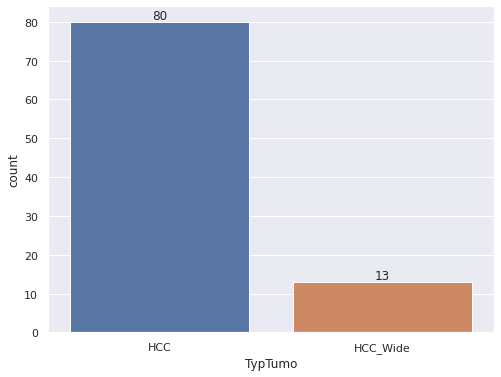

In [32]:
ax = sns.countplot(x='TypTumo', data=peakTable);
ax.bar_label(ax.containers[0]);

### MatchCaseset : ID for paired samples

In [33]:
all(peakTable['MatchCaseset'].value_counts() == 2)

True

All samples are indeed in paires

## Feature visualisation

The following visualisations show the distributions of the first 10 features of the peak table.

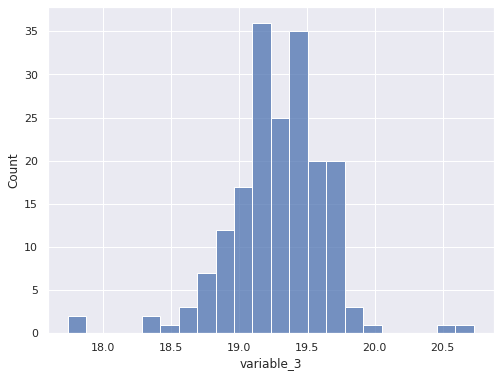

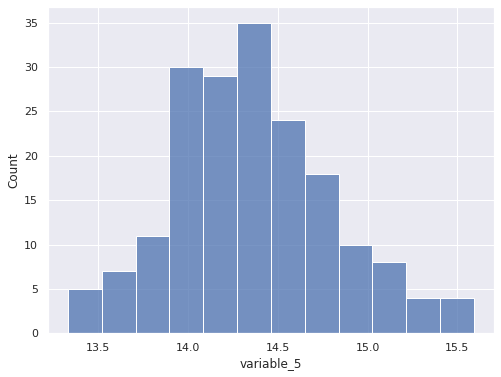

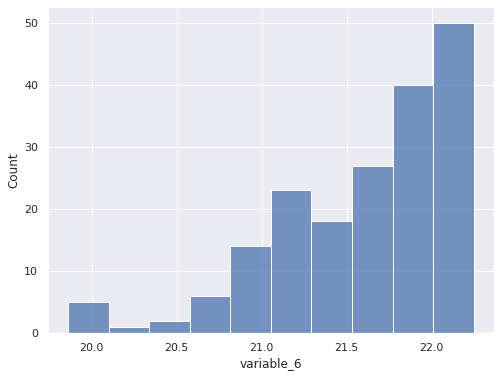

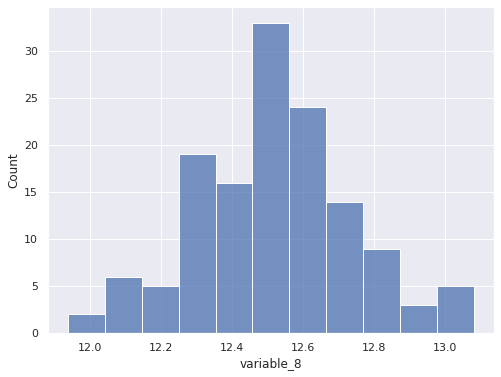

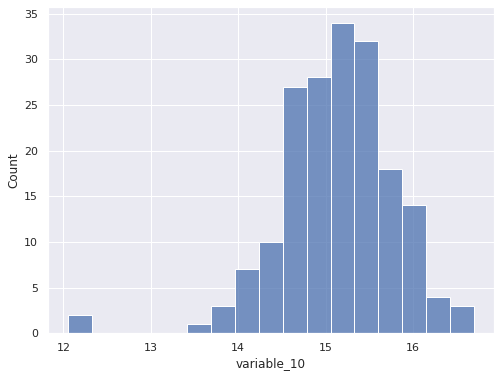

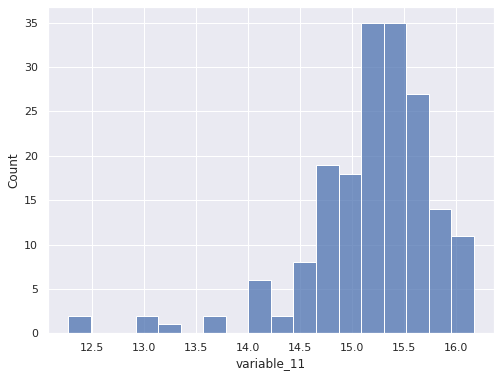

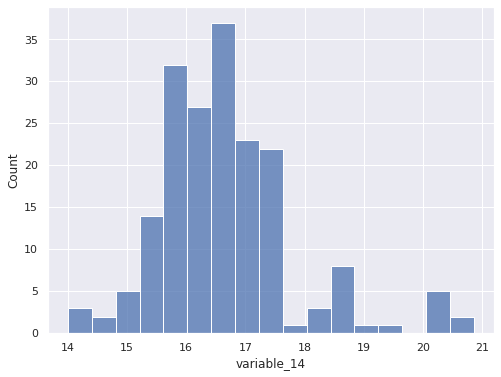

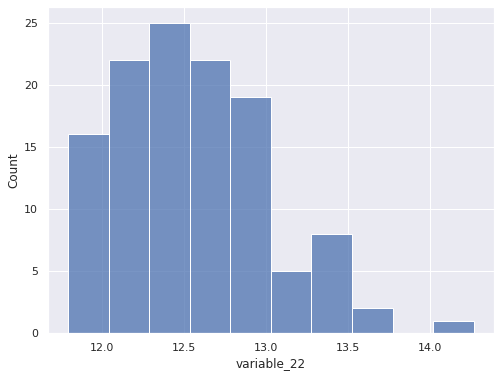

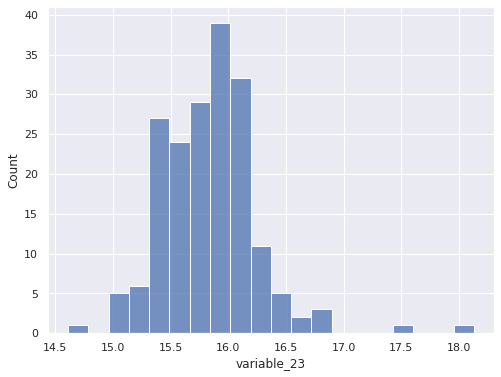

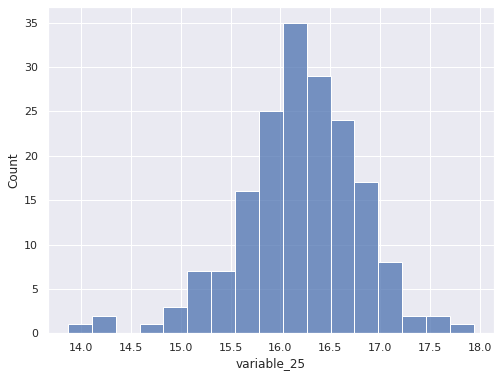

In [34]:
for col in X.columns[0:10]:
    
    plt.figure()
    sns.histplot(X[col])

Some of the compounds seem to be normally distributed, some other present extreme values. We can maybe think that these non-normal distribution show the difference between Healthy and Patient samples ?

### Feature visualisation, separated according to group

------------------------------------------------------------------------------------------------------------------------


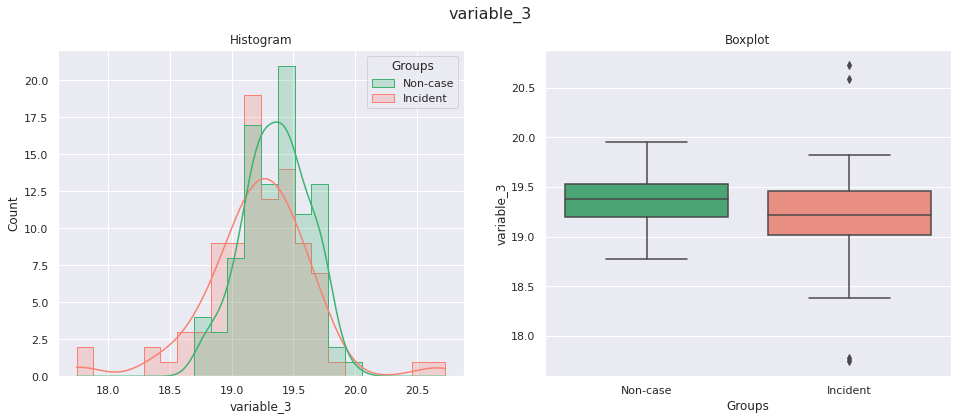

------------------------------------------------------------------------------------------------------------------------


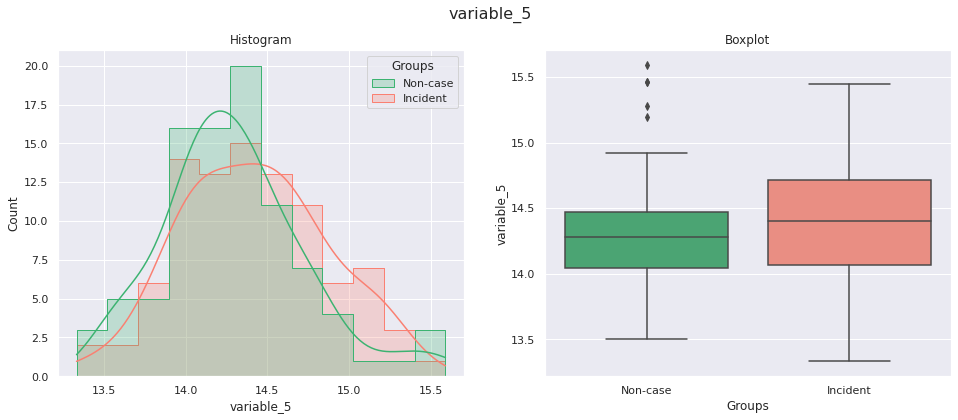

------------------------------------------------------------------------------------------------------------------------


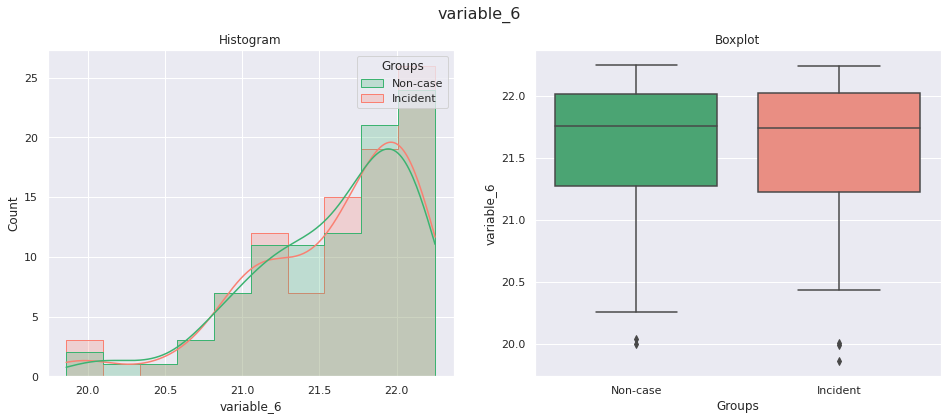

------------------------------------------------------------------------------------------------------------------------


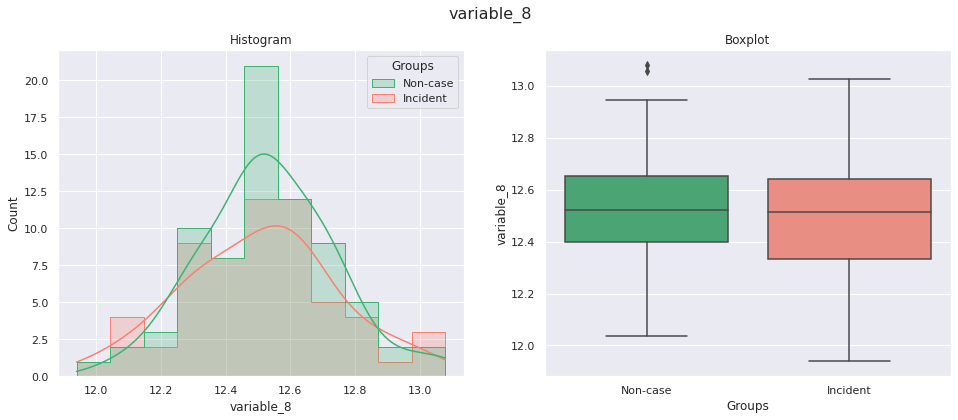

------------------------------------------------------------------------------------------------------------------------


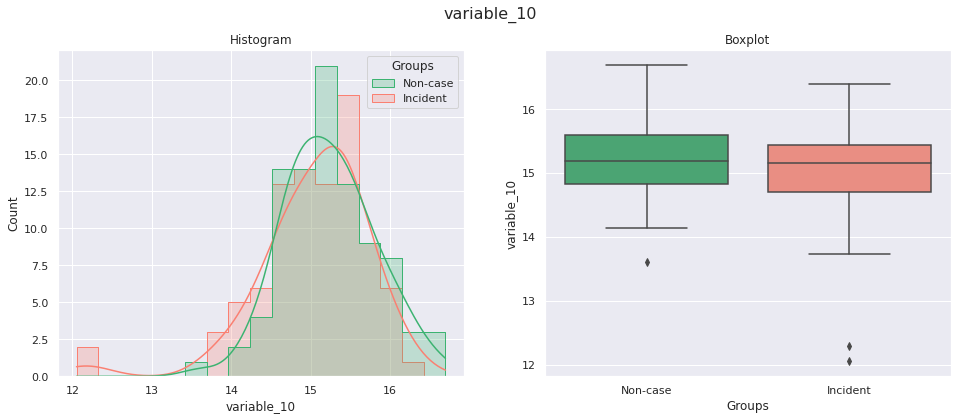

------------------------------------------------------------------------------------------------------------------------


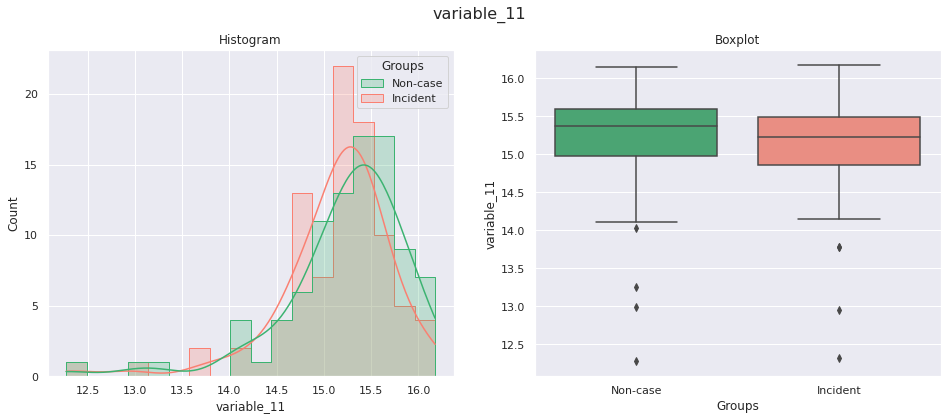

------------------------------------------------------------------------------------------------------------------------


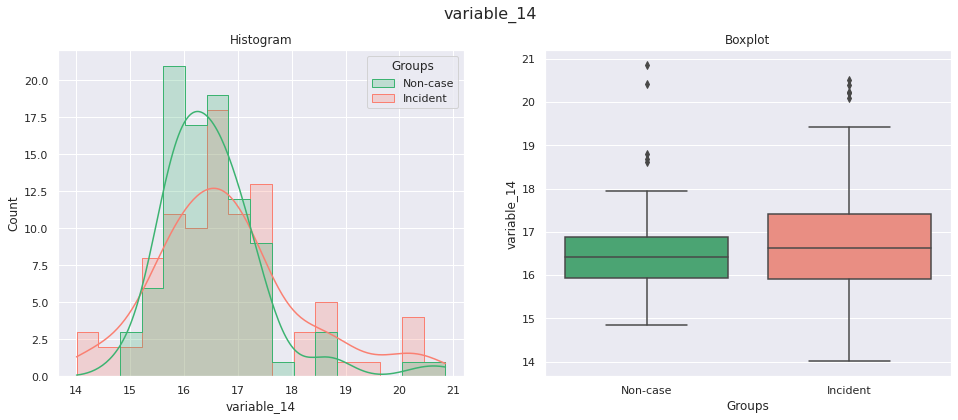

------------------------------------------------------------------------------------------------------------------------


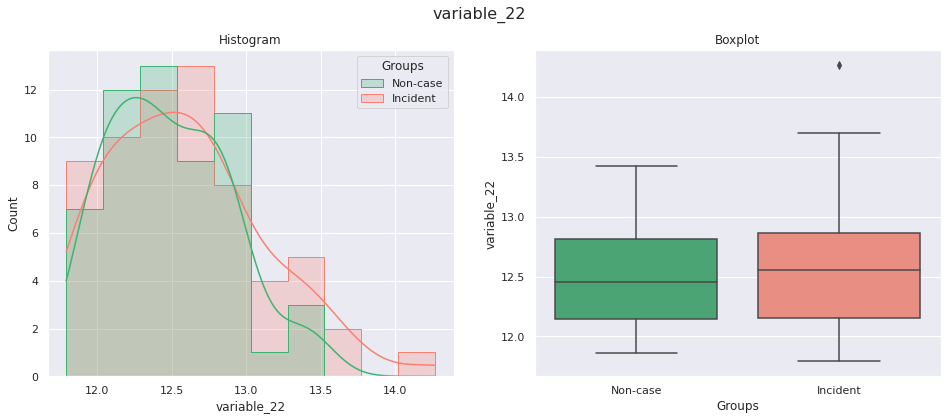

------------------------------------------------------------------------------------------------------------------------


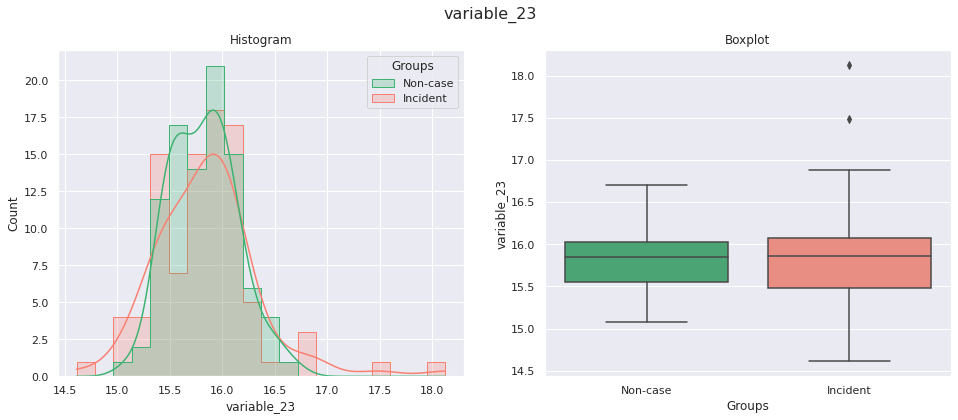

------------------------------------------------------------------------------------------------------------------------


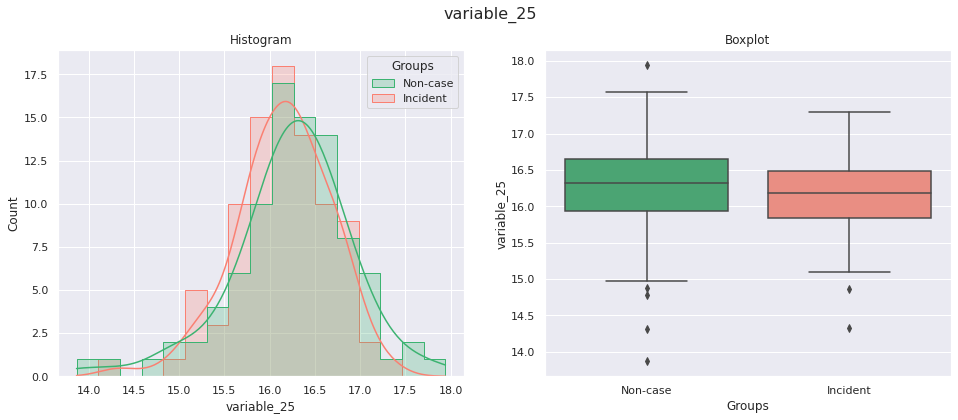

In [35]:
palette = {'Incident': 'salmon', 'Non-case': 'mediumseagreen'}

for col in [col for col in peakTable.columns if 'variable' in col][:10]:
    
    plt.figure(figsize=(16, 6))
    plt.subplot(1, 2, 1)
    sns.histplot(data=peakTable, x=peakTable[col], hue='Groups', hue_order=['Non-case', 'Incident'], kde=True, element='step', palette=palette)
    plt.title('Histogram')
    
    plt.subplot(1, 2, 2)
    sns.boxplot(x='Groups', y=col, data=peakTable, order=['Non-case', 'Incident'], palette=palette)
    plt.title('Boxplot')
    
    plt.suptitle(col, fontsize=16)
    
    print(120 * '-')
    
    plt.show()

On this visualisations, it is really difficult to see a clear difference between the Incident and Non-case groups.

### Feature visualisation, separated according to group and tumor type

In [36]:
peakTable_copy = peakTable.copy()
peakTable_copy['TypTumo'] = peakTable_copy['TypTumo'].fillna('Non-case')
peakTable_copy.head()

,SampleID,Groups,MatchCaseset,TypTumo,CaseHCCWide,EPICID,EPICBioID,AliquotID,variable_3,variable_5,...,variable_2326,variable_2328,variable_2329,variable_2332,variable_2339,variable_2340,variable_2350,variable_2364,variable_2365,variable_2370
0,LivCan_153,Incident,82,HCC,Yes,41____41041872,41____41041872,41041872-s2#C,19.761786,14.635833,...,13.194216,12.885181,NaN,13.330208,12.052252,12.568647,13.192848,12.248590,12.114328,12.355017
1,LivCan_154,Non-case,82,Non-case,No,41____41046868,41____41046868,41046868-s2#C,19.735279,15.193396,...,12.700734,12.742979,11.929552,13.464403,13.020365,12.928643,13.697314,12.604052,NaN,12.208084
2,LivCan_267,Incident,427,HCC,Yes,41____41074588,41____41074588,41074588-s1#B,19.116076,15.446714,...,12.618229,12.485436,11.709115,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,LivCan_268,Non-case,427,Non-case,No,41____41089214,41____41089214,41089214-s1#B,19.376875,15.460525,...,12.720631,12.564338,NaN,13.397322,NaN,NaN,13.086805,NaN,11.605353,12.319119
4,LivCan_299,Incident,376,HCC_Wide,Yes,21____21103888,21____21103888,21103888-s1#B,19.555938,14.515536,...,12.564943,12.344968,12.127879,NaN,NaN,NaN,NaN,12.349830,11.926237,NaN


------------------------------------------------------------------------------------------------------------------------


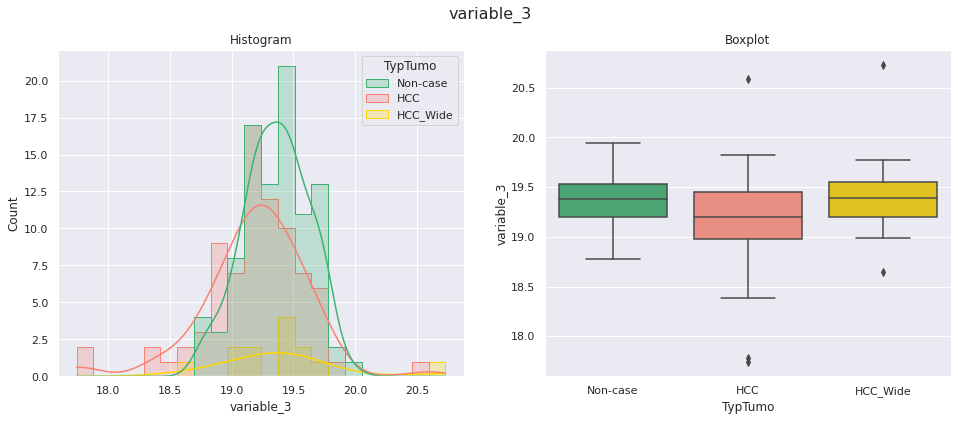

------------------------------------------------------------------------------------------------------------------------


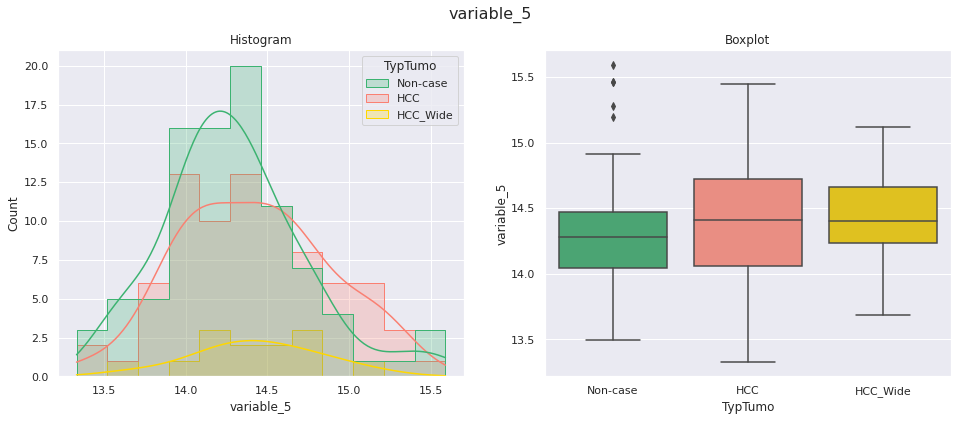

------------------------------------------------------------------------------------------------------------------------


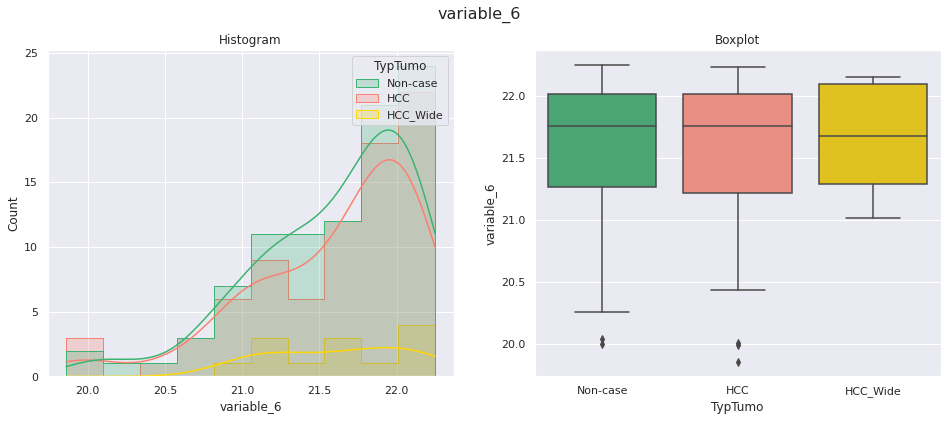

------------------------------------------------------------------------------------------------------------------------


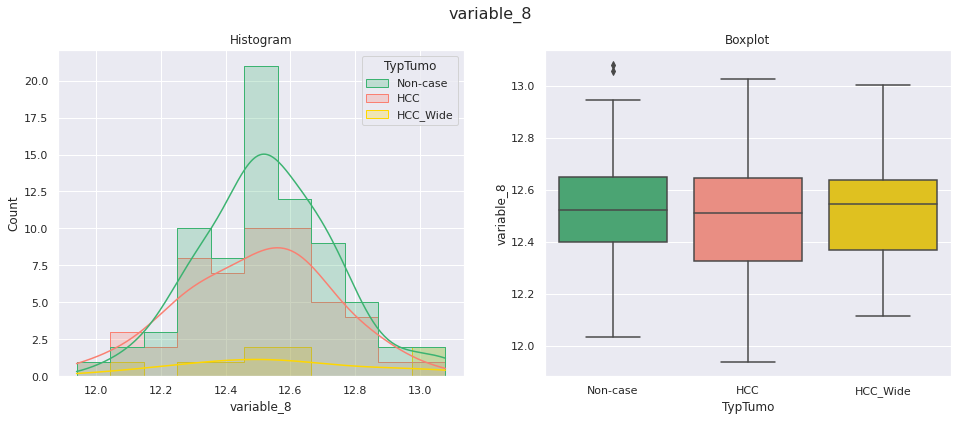

------------------------------------------------------------------------------------------------------------------------


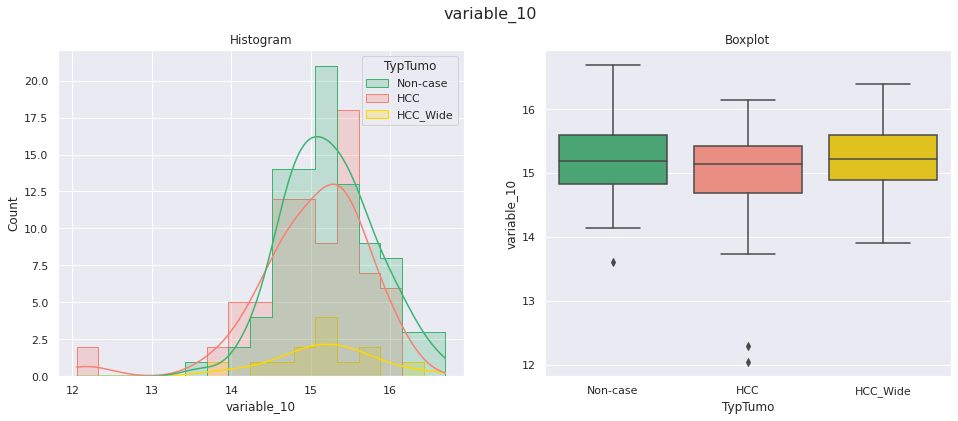

------------------------------------------------------------------------------------------------------------------------


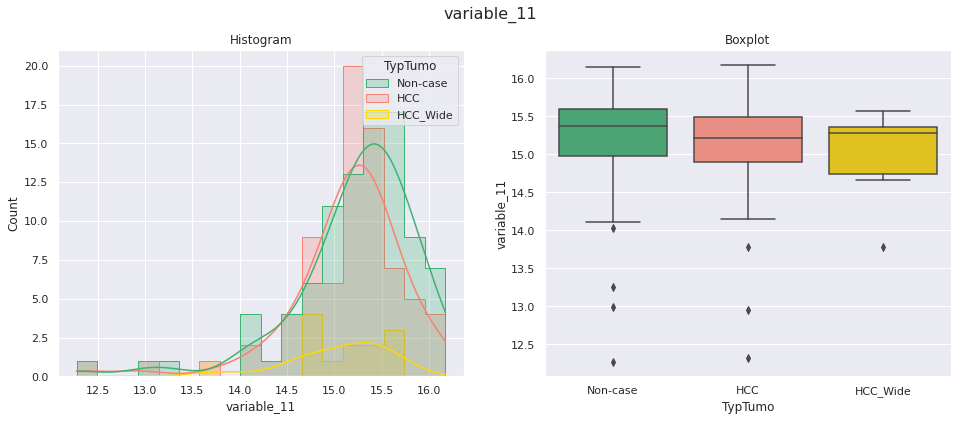

------------------------------------------------------------------------------------------------------------------------


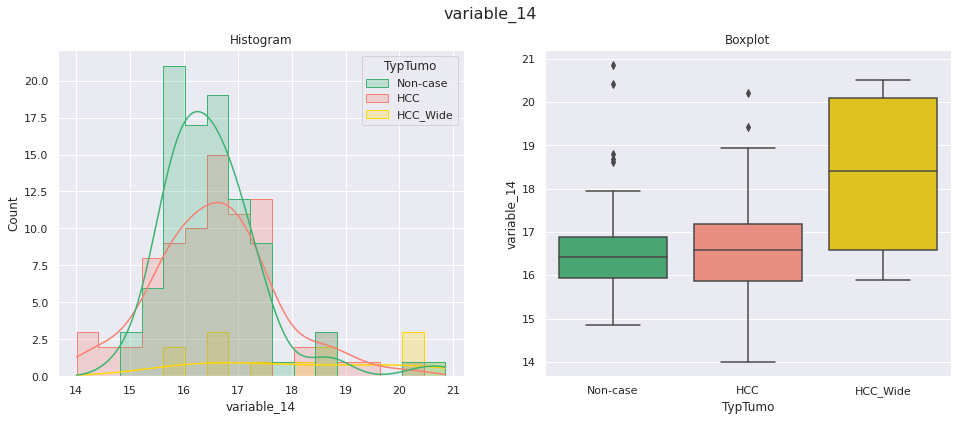

------------------------------------------------------------------------------------------------------------------------


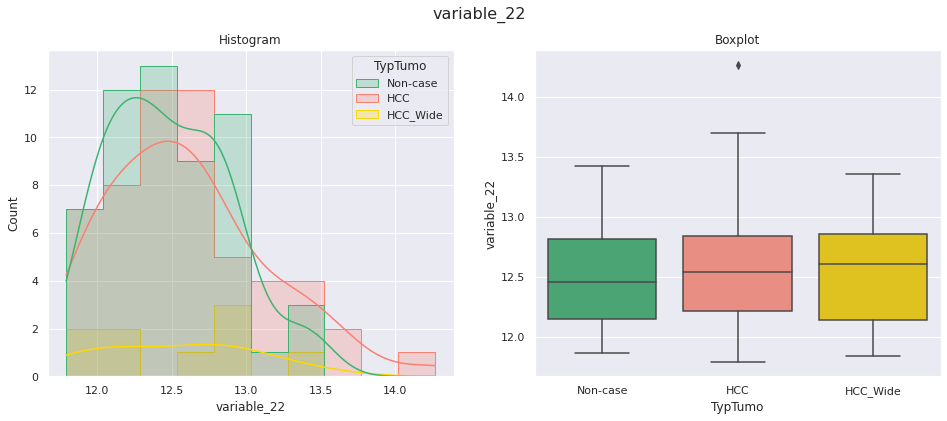

------------------------------------------------------------------------------------------------------------------------


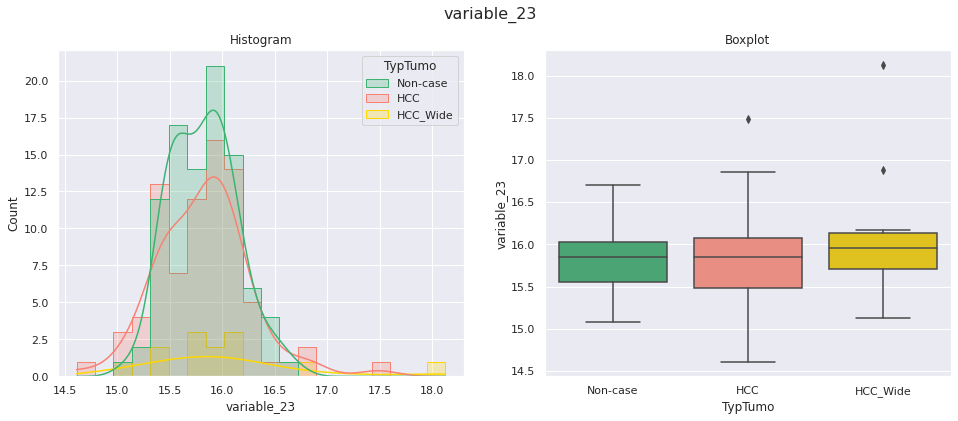

------------------------------------------------------------------------------------------------------------------------


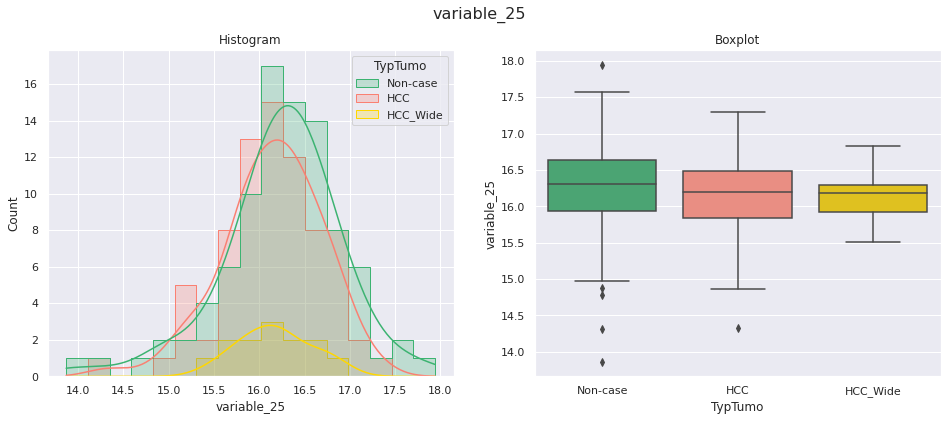

In [37]:
palette = {'Non-case': 'mediumseagreen', 'HCC': 'salmon', 'HCC_Wide': 'gold'}

for col in [col for col in peakTable_copy.columns if 'variable' in col][:10]:
    
    plt.figure(figsize=(16, 6))
    plt.subplot(1, 2, 1)
    sns.histplot(data=peakTable_copy, x=peakTable_copy[col], hue='TypTumo', hue_order=['Non-case', 'HCC', 'HCC_Wide'], kde=True, element='step', palette=palette)
    plt.title('Histogram')
    
    plt.subplot(1, 2, 2)
    sns.boxplot(x='TypTumo', y=col, data=peakTable_copy, order=['Non-case', 'HCC', 'HCC_Wide'], palette=palette)
    plt.title('Boxplot')
    
    plt.suptitle(col, fontsize=16)
    
    print(120 * '-')
    
    plt.show()

### Visualise feature correlations

On the following heatmap, we can see the correlation table between all the features.

We can use different methods in the function <code>corr()</code> :
- <code>pearson</code> : measures the linear relationship between two variables
- <code>spearman</code> : measures the statistical dependence between the rankings of two variables i.e. described using a monotonic function
- <code>kendall</code> : also measures a rank correlation

Spearman and Kendall methods are more robust because they don't make the assumption that the data follows a normal distribution.

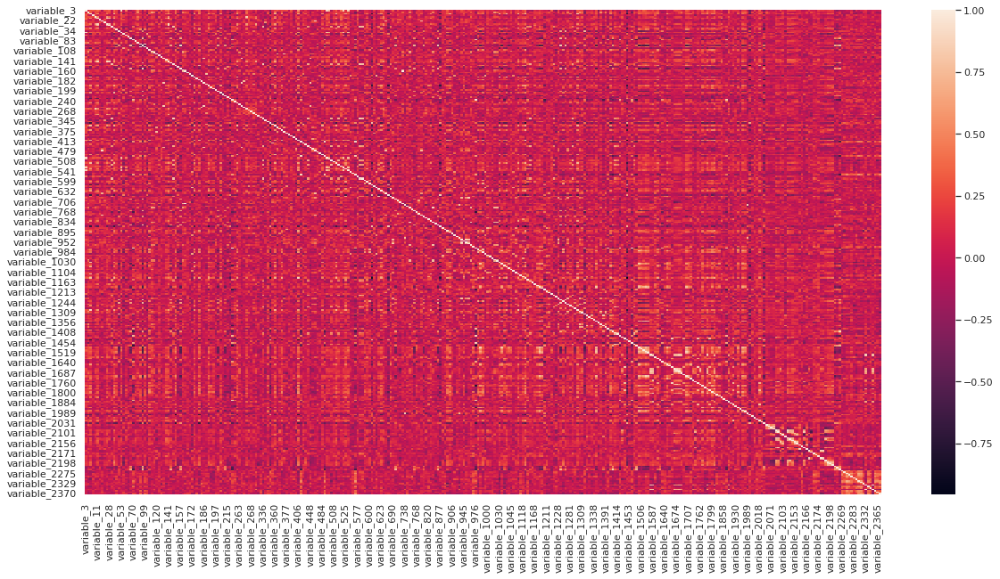

In [38]:
plt.figure(figsize=(20,10))
sns.heatmap(X.corr(method='spearman'));

On this heatmap, the light dots are the features pairs which have a strong positive or negative correlation

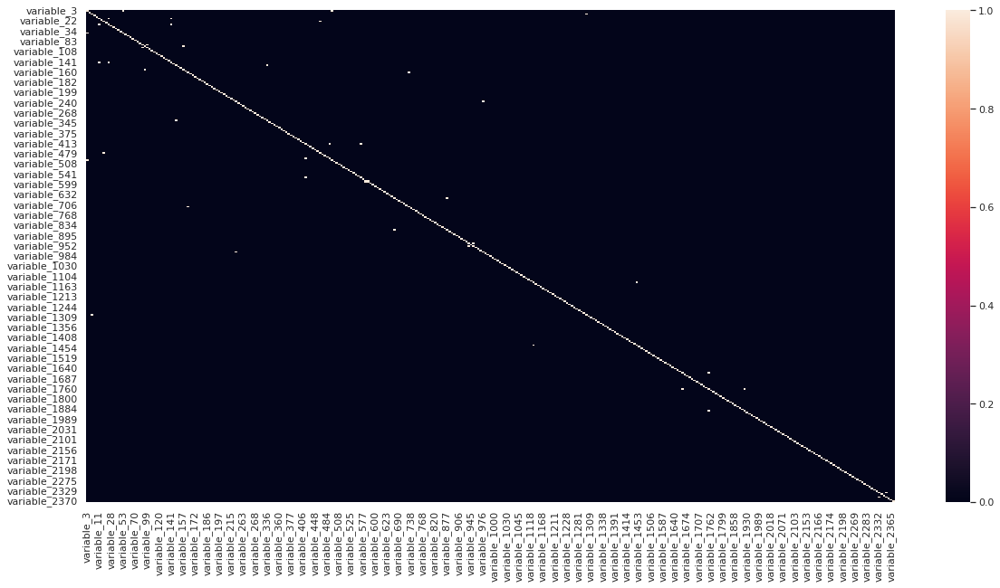

In [39]:
plt.figure(figsize=(20,10))
sns.heatmap((X.corr(method='pearson') > 0.9) | (X.corr(method='pearson') < -0.9));

On the previous notebook, for each compound, we removed the features with a too strong correlation. This means that the pairs of features above with a strong correlation should not belong to the same compound.

### Test of normality with Shapiro-Wilk test : _scipy.stats.shapiro_

For each variable in the peak table, we want to know if it is normally distributed, to apply either parametric ou non-parametric tests in the follow-up.

In [40]:
shapiro_results_X = shapiro_test_df(X)
shapiro_results_X

,shapiro_score,pvalue
Compounds,,
variable_3,0.937199,3.106757e-07
variable_5,0.986075,6.421676e-02
variable_6,0.897900,5.353651e-10
variable_8,0.993316,7.750993e-01
variable_10,0.947433,2.804746e-06
...,...,...
variable_2340,0.981445,1.058098e-01
variable_2350,0.992897,8.281244e-01
variable_2364,0.987211,3.209825e-01


In [41]:
alpha = 0.05
print(f'With alpha={alpha}, {len(shapiro_results_X[shapiro_results_X["pvalue"] < alpha]) / len(shapiro_results_X) * 100:.2f}% of features are normally distributed')

With alpha=0.05, 69.73% of features are normally distributed


## Paired tests between two groups (Incident vs Non-case) :
### $\rightarrow$ paired t-test (parametric) or Wilcoxon (non-parametric)

<center>
<img src="../img/paired_tests.png" alt="Schema for statistical analysis of variable distributions" width="800"/>
</center>


In [42]:
test_result = paired_test_t_or_Wilcoxon(peakTable, X, alpha_shapiro=0.05)
test_result

Time to compute : 00:00:42


,NormallyDistributed,TestApplied,statistic,pvalue
Variable,,,,
variable_3,False,Wilcoxon,1270.000000,0.000452
variable_5,True,Paired t-test,2.644733,0.009630
variable_6,False,Wilcoxon,2082.000000,0.691685
variable_8,True,Paired t-test,-1.091111,0.280671
variable_10,True,Paired t-test,-1.994325,0.049177
...,...,...,...,...
variable_2340,True,Paired t-test,-0.059732,0.952666
variable_2350,True,Paired t-test,-0.091754,0.927432
variable_2364,True,Paired t-test,0.494443,0.623698


In [43]:
alpha = 0.05
print(f'With alpha={alpha}, {len(test_result[test_result["pvalue"] < alpha]) / len(test_result) * 100 :.1f}% \
of features are significantly differentially distributed between Incident and Non-case groups.')

With alpha=0.05, 19.3% of features are significantly differentially distributed between Incident and Non-case groups.


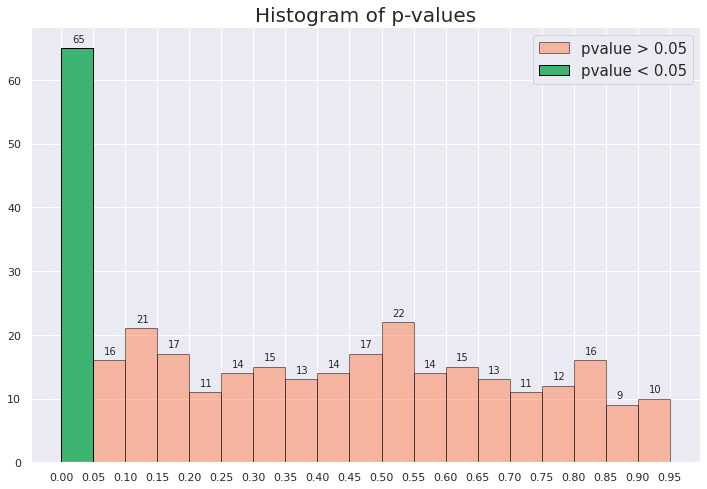

In [44]:
plot_hist_pvalue(test_result, 0.05)

### Multiple testing correction

"Statistical hypothesis testing is based on rejecting the null hypothesis if the likelihood of the observed data under the null hypotheses is low. If multiple hypotheses are tested, the chance of observing a rare event increases, and therefore, the likelihood of incorrectly rejecting a null hypothesis (i.e., making a Type I error) increases." (cf [link](https://en.wikipedia.org/wiki/Bonferroni_correction))

"Multiple testing correction refers to making statistical tests more stringent in order to counteract the problem of multiple testing" (cf. [link](https://en.wikipedia.org/wiki/Multiple_comparisons_problem))

## Resources :

- http://www.biostathandbook.com/multiplecomparisons.html
- https://en.wikipedia.org/wiki/Holm%E2%80%93Bonferroni_method#Adjusted_p-values
- https://towardsdatascience.com/an-overview-of-methods-to-address-the-multiple-comparison-problem-310427b3ba92
- https://www.nonlinear.com/support/progenesis/comet/faq/v2.0/pq-values.aspx

## Test with Bonferroni correction

In [45]:
test_result2 = pvalue_correction(df = test_result, correction = 'Bonferroni', alpha = 0.05)
test_result2

,NormallyDistributed,TestApplied,statistic,pvalue,alpha,H0rejected,alphaCorrected,H0rejectedCorrected
Variable,,,,,,,,
variable_3,False,Wilcoxon,1270.000000,0.000452,0.05,True,0.000148,False
variable_5,True,Paired t-test,2.644733,0.009630,0.05,True,0.000148,False
variable_6,False,Wilcoxon,2082.000000,0.691685,0.05,False,0.000148,False
variable_8,True,Paired t-test,-1.091111,0.280671,0.05,False,0.000148,False
variable_10,True,Paired t-test,-1.994325,0.049177,0.05,True,0.000148,False
...,...,...,...,...,...,...,...,...
variable_2340,True,Paired t-test,-0.059732,0.952666,0.05,False,0.000148,False
variable_2350,True,Paired t-test,-0.091754,0.927432,0.05,False,0.000148,False
variable_2364,True,Paired t-test,0.494443,0.623698,0.05,False,0.000148,False


In [46]:
print(f'Before correction, {sum(test_result2["H0rejected"]) / test_result2.shape[0] * 100 :.1f}% \
of features are significantly differentially distributed ({sum(test_result2["H0rejected"])} features).')
print(f'After correction, {sum(test_result2["H0rejectedCorrected"]) / test_result2.shape[0] * 100 :.1f}% \
of features are still significantly differentially distributed ({sum(test_result2["H0rejectedCorrected"])} features).')
print(f'We will explore later with an other function to which biological compounds these \
{sum(test_result2["H0rejectedCorrected"])} features correspond !')
print()
print(f'{test_result2[(test_result2["H0rejected"] == True) & (test_result2["H0rejectedCorrected"] == False)].shape[0]} \
features were significant before but not after the correction, for example the following five features :')

Before correction, 19.3% of features are significantly differentially distributed (65 features).
After correction, 2.7% of features are still significantly differentially distributed (9 features).
We will explore later with an other function to which biological compounds these 9 features correspond !

56 features were significant before but not after the correction, for example the following five features :


In [47]:
test_result2[(test_result2['H0rejected'] == True) & (test_result2['H0rejectedCorrected'] == False)].head()

,NormallyDistributed,TestApplied,statistic,pvalue,alpha,H0rejected,alphaCorrected,H0rejectedCorrected
Variable,,,,,,,,
variable_3,False,Wilcoxon,1270.000000,0.000452,0.05,True,0.000148,False
variable_5,True,Paired t-test,2.644733,0.009630,0.05,True,0.000148,False
variable_10,True,Paired t-test,-1.994325,0.049177,0.05,True,0.000148,False
variable_31,True,Paired t-test,-2.132354,0.035863,0.05,True,0.000148,False
variable_56,True,Paired t-test,2.588981,0.011189,0.05,True,0.000148,False


Below we can observe the pvalue for each feature, zooming on features which have a pvalue lower than *alpha* and *alphaCorrected*.

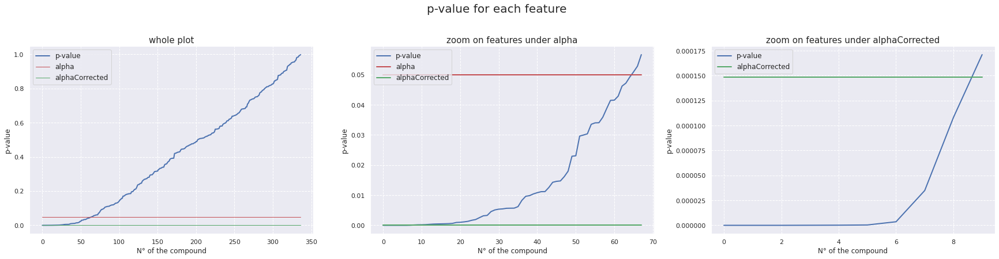

In [48]:
plot_pvalue(test_result2)

Here is the barplot of the number of features with are significantly differentially distributed (True) or not (False).

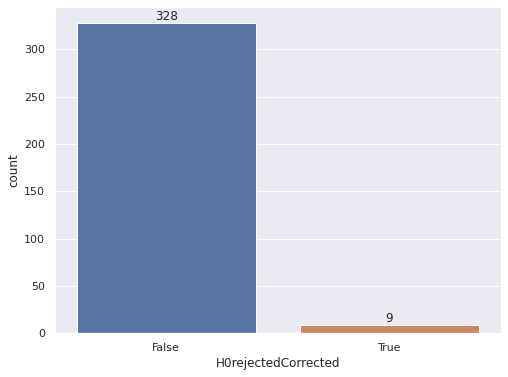

In [49]:
ax = sns.countplot(x='H0rejectedCorrected', data=test_result2);
ax.bar_label(ax.containers[0]);

Below are the features which have a significant difference between Incident and Non-case groups.

In [50]:
test_result2[test_result2['H0rejectedCorrected'] == True]

,NormallyDistributed,TestApplied,statistic,pvalue,alpha,H0rejected,alphaCorrected,H0rejectedCorrected
Variable,,,,,,,,
variable_455,True,Paired t-test,4.937208,3.572263e-06,0.05,True,0.000148,True
variable_1587,True,Paired t-test,-5.853069,7.357586e-08,0.05,True,0.000148,True
variable_1667,True,Paired t-test,-6.822675,9.279162e-10,0.05,True,0.000148,True
variable_1674,True,Paired t-test,-5.685114,1.528873e-07,0.05,True,0.000148,True
variable_1800,True,Paired t-test,-4.385774,3.487572e-05,0.05,True,0.000148,True
variable_2013,True,Paired t-test,-6.955168,1.126615e-09,0.05,True,0.000148,True
variable_2141,True,Paired t-test,-5.485787,3.598747e-07,0.05,True,0.000148,True
variable_2167,False,Wilcoxon,1175.000000,1.080234e-04,0.05,True,0.000148,True
variable_2196,True,Paired t-test,-6.697179,1.924239e-09,0.05,True,0.000148,True


In [51]:
list(test_result2[test_result2['H0rejectedCorrected'] == True].index)

['variable_455',
 'variable_1587',
 'variable_1667',
 'variable_1674',
 'variable_1800',
 'variable_2013',
 'variable_2141',
 'variable_2167',
 'variable_2196']

We will explore later with an other function to which biological compounds these features correspond !

## Test with Holm-Bonferroni correction

In [52]:
test_result3 = pvalue_correction(df = test_result, correction = 'Holm-Bonferroni', alpha = 0.05)
test_result3

,NormallyDistributed,TestApplied,statistic,pvalue,alpha,H0rejected,Rank,alphaCorrected,H0rejectedCorrected
Variable,,,,,,,,,
variable_3,False,Wilcoxon,1270.000000,0.000452,0.05,True,323,0.000155,False
variable_5,True,Paired t-test,2.644733,0.009630,0.05,True,300,0.000167,False
variable_6,False,Wilcoxon,2082.000000,0.691685,0.05,False,71,0.000704,False
variable_8,True,Paired t-test,-1.091111,0.280671,0.05,False,199,0.000251,False
variable_10,True,Paired t-test,-1.994325,0.049177,0.05,True,273,0.000183,False
...,...,...,...,...,...,...,...,...,...
variable_2340,True,Paired t-test,-0.059732,0.952666,0.05,False,11,0.004545,False
variable_2350,True,Paired t-test,-0.091754,0.927432,0.05,False,18,0.002778,False
variable_2364,True,Paired t-test,0.494443,0.623698,0.05,False,92,0.000543,False


In [53]:
print(f'Before correction, {sum(test_result3["H0rejected"]) / test_result3.shape[0] * 100 :.1f}% \
of features are significantly differentially distributed ({sum(test_result3["H0rejected"])} features).')
print(f'After correction, {sum(test_result3["H0rejectedCorrected"]) / test_result3.shape[0] * 100 :.1f}% \
of features are still significantly differentially distributed ({sum(test_result3["H0rejectedCorrected"])} features).')
print(f'We will explore later with an other function to which biological compounds these \
{sum(test_result3["H0rejectedCorrected"])} features correspond !')
print()
print(f'{test_result3[(test_result3["H0rejected"] == True) & (test_result3["H0rejectedCorrected"] == False)].shape[0]} \
features were significant before but not after the correction, for example the following five features :')

Before correction, 19.3% of features are significantly differentially distributed (65 features).
After correction, 2.7% of features are still significantly differentially distributed (9 features).
We will explore later with an other function to which biological compounds these 9 features correspond !

56 features were significant before but not after the correction, for example the following five features :


Below we can observe the pvalue for each feature, zooming on features which have a pvalue lower than *alpha* and *alphaCorrected*.

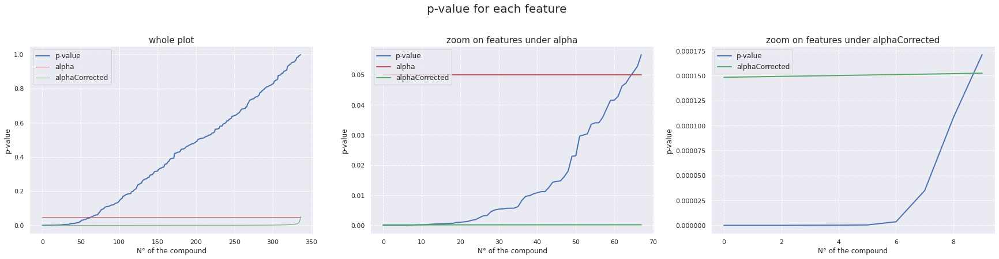

In [54]:
plot_pvalue(test_result3)

Here is the barplot of the number of features with are significantly differentially distributed (True) or not (False).

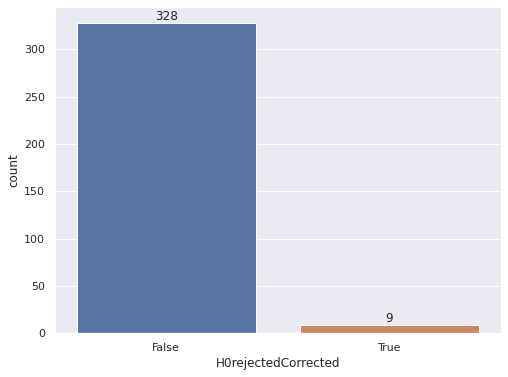

In [55]:
ax = sns.countplot(x='H0rejectedCorrected', data=test_result3);
ax.bar_label(ax.containers[0]);

Below are the features which have a significant difference between Incident and Non-case groups.

In [56]:
test_result3[test_result3['H0rejectedCorrected'] == True]

,NormallyDistributed,TestApplied,statistic,pvalue,alpha,H0rejected,Rank,alphaCorrected,H0rejectedCorrected
Variable,,,,,,,,,
variable_455,True,Paired t-test,4.937208,3.572263e-06,0.05,True,331,0.000151,True
variable_1587,True,Paired t-test,-5.853069,7.357586e-08,0.05,True,334,0.000150,True
variable_1667,True,Paired t-test,-6.822675,9.279162e-10,0.05,True,337,0.000148,True
variable_1674,True,Paired t-test,-5.685114,1.528873e-07,0.05,True,333,0.000150,True
variable_1800,True,Paired t-test,-4.385774,3.487572e-05,0.05,True,330,0.000152,True
variable_2013,True,Paired t-test,-6.955168,1.126615e-09,0.05,True,336,0.000149,True
variable_2141,True,Paired t-test,-5.485787,3.598747e-07,0.05,True,332,0.000151,True
variable_2167,False,Wilcoxon,1175.000000,1.080234e-04,0.05,True,329,0.000152,True
variable_2196,True,Paired t-test,-6.697179,1.924239e-09,0.05,True,335,0.000149,True


In [57]:
list(test_result3[test_result3['H0rejectedCorrected'] == True].index)

['variable_455',
 'variable_1587',
 'variable_1667',
 'variable_1674',
 'variable_1800',
 'variable_2013',
 'variable_2141',
 'variable_2167',
 'variable_2196']

We will explore later with an other function to which biological compounds these features correspond !

## Test with Benjamini-Hochberg correction

In [58]:
test_result4 = pvalue_correction(df = test_result, correction = 'Benjamini-Hochberg', alpha = 0.01)
test_result4

,NormallyDistributed,TestApplied,statistic,pvalue,alpha,H0rejected,Rank,alphaCorrected,H0rejectedCorrected
Variable,,,,,,,,,
variable_3,False,Wilcoxon,1270.000000,0.000452,0.01,True,15,0.000445,False
variable_5,True,Paired t-test,2.644733,0.009630,0.01,True,38,0.001128,False
variable_6,False,Wilcoxon,2082.000000,0.691685,0.01,False,267,0.007923,False
variable_8,True,Paired t-test,-1.091111,0.280671,0.01,False,139,0.004125,False
variable_10,True,Paired t-test,-1.994325,0.049177,0.01,False,65,0.001929,False
...,...,...,...,...,...,...,...,...,...
variable_2340,True,Paired t-test,-0.059732,0.952666,0.01,False,327,0.009703,False
variable_2350,True,Paired t-test,-0.091754,0.927432,0.01,False,320,0.009496,False
variable_2364,True,Paired t-test,0.494443,0.623698,0.01,False,246,0.007300,False


In [59]:
print(f'Before correction, {sum(test_result4["H0rejected"]) / test_result4.shape[0] * 100 :.1f}% \
of features are significantly differentially distributed ({sum(test_result4["H0rejected"])} features).')
print(f'After correction, {sum(test_result4["H0rejectedCorrected"]) / test_result4.shape[0] * 100 :.1f}% \
of features are still significantly differentially distributed ({sum(test_result4["H0rejectedCorrected"])} features).')
print(f'We will explore later with an other function to which biological compounds these \
{sum(test_result4["H0rejectedCorrected"])} features correspond !')
print()
print(f'{test_result4[(test_result4["H0rejected"] == True) & (test_result4["H0rejectedCorrected"] == False)].shape[0]} \
features were significant before but not after the correction, for example the following five features :')

Before correction, 11.6% of features are significantly differentially distributed (39 features).
After correction, 4.2% of features are still significantly differentially distributed (14 features).
We will explore later with an other function to which biological compounds these 14 features correspond !

25 features were significant before but not after the correction, for example the following five features :


Below we can observe the pvalue for each feature, zooming on features which have a pvalue lower than *alpha* and *alphaCorrected*.

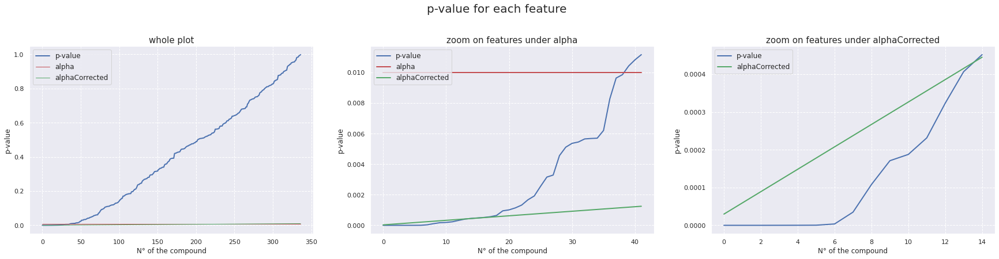

In [60]:
plot_pvalue(test_result4)

Here is the barplot of the number of features with are significantly differentially distributed (True) or not (False).

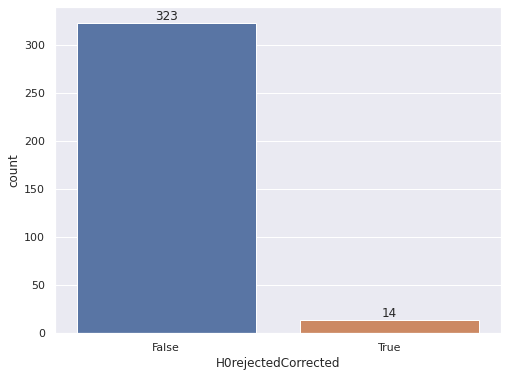

In [61]:
ax = sns.countplot(x='H0rejectedCorrected', data=test_result4);
ax.bar_label(ax.containers[0]);

Below are the features which have a significant difference between Incident and Non-case groups.

In [62]:
test_result4[test_result4['H0rejectedCorrected'] == True]

,NormallyDistributed,TestApplied,statistic,pvalue,alpha,H0rejected,Rank,alphaCorrected,H0rejectedCorrected
Variable,,,,,,,,,
variable_455,True,Paired t-test,4.937208,3.572263e-06,0.01,True,7,0.000208,True
variable_1224,True,Paired t-test,3.946625,4.068049e-04,0.01,True,14,0.000415,True
variable_1582,True,Paired t-test,-3.892422,1.877026e-04,0.01,True,11,0.000326,True
variable_1587,True,Paired t-test,-5.853069,7.357586e-08,0.01,True,4,0.000119,True
variable_1667,True,Paired t-test,-6.822675,9.279162e-10,0.01,True,1,0.000030,True
variable_1674,True,Paired t-test,-5.685114,1.528873e-07,0.01,True,5,0.000148,True
variable_1681,True,Paired t-test,-3.843810,2.314764e-04,0.01,True,12,0.000356,True
variable_1800,True,Paired t-test,-4.385774,3.487572e-05,0.01,True,8,0.000237,True
variable_2013,True,Paired t-test,-6.955168,1.126615e-09,0.01,True,2,0.000059,True


In [63]:
list(test_result4[test_result4['H0rejectedCorrected'] == True].index)

['variable_455',
 'variable_1224',
 'variable_1582',
 'variable_1587',
 'variable_1667',
 'variable_1674',
 'variable_1681',
 'variable_1800',
 'variable_2013',
 'variable_2141',
 'variable_2167',
 'variable_2175',
 'variable_2176',
 'variable_2196']

We will explore later with an other function to which biological compounds these features correspond !

## Test with FDR correction

In [64]:
test_result5 = pvalue_correction(df = test_result, correction = 'FDR', alpha = 0.01)
test_result5

,NormallyDistributed,TestApplied,statistic,pvalue,alpha,H0rejected,pvalueCorrected,H0rejectedCorrected
Variable,,,,,,,,
variable_3,False,Wilcoxon,1270.000000,0.000452,0.01,True,0.010144,False
variable_5,True,Paired t-test,2.644733,0.009630,0.01,True,0.085127,False
variable_6,False,Wilcoxon,2082.000000,0.691685,0.01,False,0.873025,False
variable_8,True,Paired t-test,-1.091111,0.280671,0.01,False,0.675987,False
variable_10,True,Paired t-test,-1.994325,0.049177,0.01,False,0.254963,False
...,...,...,...,...,...,...,...,...
variable_2340,True,Paired t-test,-0.059732,0.952666,0.01,False,0.977560,False
variable_2350,True,Paired t-test,-0.091754,0.927432,0.01,False,0.976702,False
variable_2364,True,Paired t-test,0.494443,0.623698,0.01,False,0.854415,False


In [65]:
print(f'Before correction, {sum(test_result5["H0rejected"]) / test_result5.shape[0] * 100 :.1f}% \
of features are significantly differentially distributed ({sum(test_result5["H0rejected"])} features).')
print(f'After correction, {sum(test_result5["H0rejectedCorrected"]) / test_result5.shape[0] * 100 :.1f}% \
of features are still significantly differentially distributed ({sum(test_result5["H0rejectedCorrected"])} features).')
print(f'We will explore later with an other function to which biological compounds these \
{sum(test_result5["H0rejectedCorrected"])} features correspond !')
print()
print(f'{test_result5[(test_result5["H0rejected"] == True) & (test_result5["H0rejectedCorrected"] == False)].shape[0]} \
features were significant before but not after the correction, for example the following five features :')

Before correction, 11.6% of features are significantly differentially distributed (39 features).
After correction, 4.2% of features are still significantly differentially distributed (14 features).
We will explore later with an other function to which biological compounds these 14 features correspond !

25 features were significant before but not after the correction, for example the following five features :


Below we can observe the pvalue for each feature, zooming on features which have a pvalue lower than *alpha* and *alphaCorrected*.

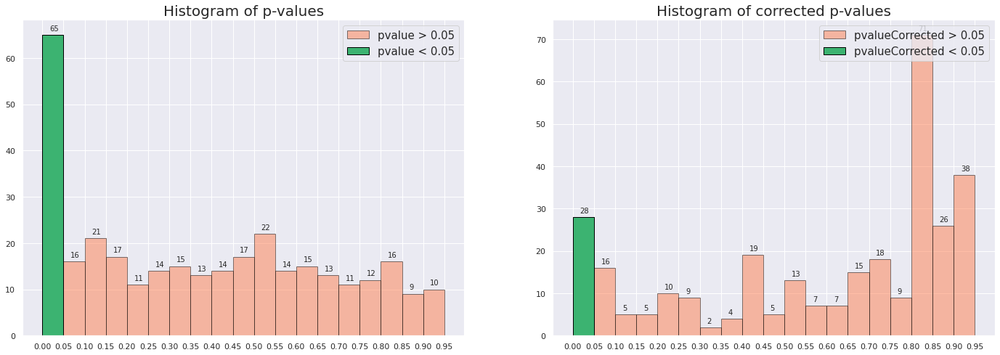

In [66]:
plot_hist_pvalue(test_result5, 0.05, plot_corrected=True)

Here is the barplot of the number of features with are significantly differentially distributed (True) or not (False).

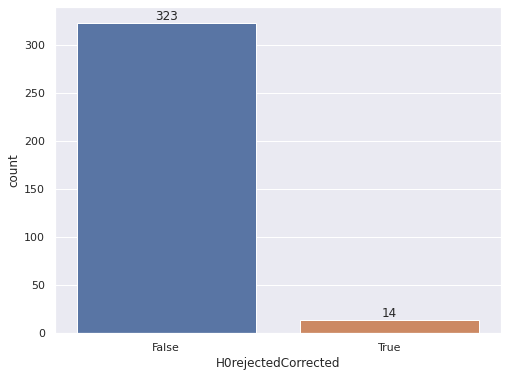

In [67]:
ax = sns.countplot(x='H0rejectedCorrected', data=test_result5);
ax.bar_label(ax.containers[0]);

Below are the features which have a significant difference between Incident and Non-case groups.

In [68]:
test_result5[test_result5['H0rejectedCorrected'] == True]

,NormallyDistributed,TestApplied,statistic,pvalue,alpha,H0rejected,pvalueCorrected,H0rejectedCorrected
Variable,,,,,,,,
variable_455,True,Paired t-test,4.937208,3.572263e-06,0.01,True,1.719790e-04,True
variable_1224,True,Paired t-test,3.946625,4.068049e-04,0.01,True,9.792376e-03,True
variable_1582,True,Paired t-test,-3.892422,1.877026e-04,0.01,True,5.750525e-03,True
variable_1587,True,Paired t-test,-5.853069,7.357586e-08,0.01,True,6.198766e-06,True
variable_1667,True,Paired t-test,-6.822675,9.279162e-10,0.01,True,1.898347e-07,True
variable_1674,True,Paired t-test,-5.685114,1.528873e-07,0.01,True,1.030460e-05,True
variable_1681,True,Paired t-test,-3.843810,2.314764e-04,0.01,True,6.500628e-03,True
variable_1800,True,Paired t-test,-4.385774,3.487572e-05,0.01,True,1.469140e-03,True
variable_2013,True,Paired t-test,-6.955168,1.126615e-09,0.01,True,1.898347e-07,True


In [69]:
list(test_result5[test_result5['H0rejectedCorrected'] == True].index)

['variable_455',
 'variable_1224',
 'variable_1582',
 'variable_1587',
 'variable_1667',
 'variable_1674',
 'variable_1681',
 'variable_1800',
 'variable_2013',
 'variable_2141',
 'variable_2167',
 'variable_2175',
 'variable_2176',
 'variable_2196']

We will explore later with an other function to which biological compounds these features correspond !

# Explore variables with are significantly differentially distributed between _Incident_ and _Non-case_

### Below is the subset of the paired test results after correction

In [70]:
test_result4[test_result4['H0rejectedCorrected'] == True]

,NormallyDistributed,TestApplied,statistic,pvalue,alpha,H0rejected,Rank,alphaCorrected,H0rejectedCorrected
Variable,,,,,,,,,
variable_455,True,Paired t-test,4.937208,3.572263e-06,0.01,True,7,0.000208,True
variable_1224,True,Paired t-test,3.946625,4.068049e-04,0.01,True,14,0.000415,True
variable_1582,True,Paired t-test,-3.892422,1.877026e-04,0.01,True,11,0.000326,True
variable_1587,True,Paired t-test,-5.853069,7.357586e-08,0.01,True,4,0.000119,True
variable_1667,True,Paired t-test,-6.822675,9.279162e-10,0.01,True,1,0.000030,True
variable_1674,True,Paired t-test,-5.685114,1.528873e-07,0.01,True,5,0.000148,True
variable_1681,True,Paired t-test,-3.843810,2.314764e-04,0.01,True,12,0.000356,True
variable_1800,True,Paired t-test,-4.385774,3.487572e-05,0.01,True,8,0.000237,True
variable_2013,True,Paired t-test,-6.955168,1.126615e-09,0.01,True,2,0.000059,True


### Below is the subset of the original peak table with only the columns which are significantly differentially distributed between _Incident_ and _Non-case_

In [71]:
subset_X = X[test_result4[test_result4['H0rejectedCorrected'] == True].index]
subset_X

,variable_455,variable_1224,variable_1582,variable_1587,variable_1667,variable_1674,variable_1681,variable_1800,variable_2013,variable_2141,variable_2167,variable_2175,variable_2176,variable_2196
0,14.901102,11.776399,23.193580,22.727159,21.323783,20.524991,16.718552,14.323164,13.973290,15.986642,14.104599,13.998148,12.920181,14.564683
1,13.742697,NaN,23.309319,22.852766,21.976711,20.288004,17.138026,14.460135,13.532489,16.890236,14.538937,14.417000,13.434169,14.612778
2,14.248796,12.889435,22.140140,22.141968,20.243623,19.234748,15.876230,13.621373,13.701981,16.150009,14.309805,14.171836,13.108371,14.480289
3,14.237655,12.406618,23.152943,22.946740,20.919862,20.295436,16.846700,14.624331,13.764644,15.888334,14.393094,14.025200,13.060972,14.682792
4,15.256830,13.183449,22.374462,22.107158,19.791554,19.077569,15.802826,13.769721,12.445936,15.201124,14.677153,14.036792,13.047628,14.367795
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181,13.694057,NaN,22.715137,22.543090,21.756619,20.527349,16.760570,12.753340,13.285125,15.012310,14.342794,13.917362,13.037318,13.868378
182,15.459569,11.859027,22.528103,22.059927,20.736121,19.839717,16.096347,12.700758,12.951560,14.881942,14.620406,13.868587,13.137159,14.253054
183,15.456830,NaN,22.761386,22.218538,20.888653,19.858358,16.002179,12.678920,13.149555,15.498081,14.557569,14.161382,13.114331,14.434996
184,14.275241,NaN,22.050695,22.113462,20.669607,19.402183,15.879798,12.772960,12.779032,14.866505,14.582893,14.124636,13.004613,14.287804


### Here we check if the variables have missing values

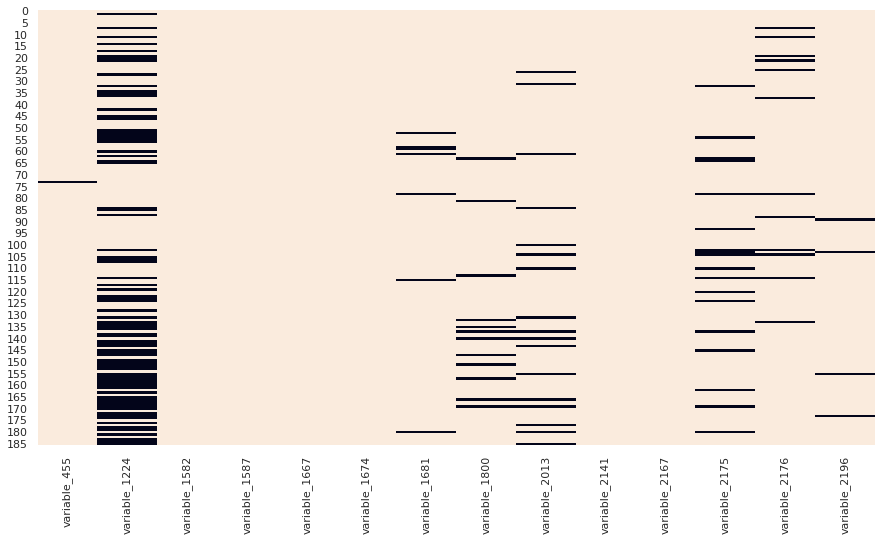

In [72]:
plt.figure(figsize=(15,8))
sns.heatmap(subset_X.notna(), cbar=False);

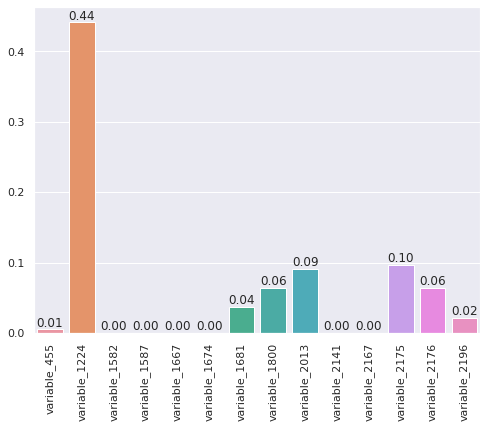

In [73]:
ax = sns.barplot(x=(subset_X.isna().sum()/len(subset_X)).index, y=(subset_X.isna().sum()/len(subset_X)).values);
plt.xticks(rotation=90)
ax.bar_label(ax.containers[0], fmt='%.2f');

It would be better for further analysis to keep only features with less than a certain percent of missing value.

### Here we check if the variables have been identified using metaboigniter

In [108]:
variable_identification = pd.read_csv(pwd + 'data/HILIC_POS_results/process_output_quantid_pos_camera_metfrag/varsPOSout_pos_metfrag.txt', sep='\t', decimal='.', na_values='NA')
variable_identification

,variableMetadata,parentMZ,parentRT,Score,MonoisotopicMass,SMILES,InChIKey,Name,NoExplPeaks,NumberPeaksUsed,...,xcmsCamera_mzmin,xcmsCamera_mzmax,xcmsCamera_rt,xcmsCamera_rtmin,xcmsCamera_rtmax,xcmsCamera_npeaks,xcmsCamera_isotopes,xcmsCamera_adduct,xcmsCamera_pcgroup,imputed
0,variable_3,61.0398,93.949,2.0,60.032363,NC(N)=O,XSQUKJJJFZCRTK-UHFFFAOYSA-N,Urea,31,52,...,61.039608,61.039794,93.3840,92.664,94.640,211,NaN,NaN,36,No
1,variable_5,62.0601,276.539,2.0,61.052764,NCCO,HZAXFHJVJLSVMW-UHFFFAOYSA-N,Ethanolamine,40,175,...,62.059914,62.060261,275.0040,273.825,275.644,210,NaN,NaN,56,No
2,variable_6,140.0682,304.407,2.0,117.078979,NCCCCC(O)=O,JJMDCOVWQOJGCB-UHFFFAOYSA-N,delta-Aminovaleric acid,115,287,...,64.015582,64.016015,299.3860,195.740,317.234,272,[1][M]+,NaN,22,yes
3,variable_7,140.0682,304.407,2.0,117.078979,NCCCCC(O)=O,JJMDCOVWQOJGCB-UHFFFAOYSA-N,delta-Aminovaleric acid,115,287,...,65.018672,65.019122,299.3890,276.857,300.455,213,[1][M+1]+,NaN,22,yes
4,variable_8,61.0398,93.949,2.0,60.032363,NC(N)=O,XSQUKJJJFZCRTK-UHFFFAOYSA-N,Urea,31,52,...,65.018564,65.019229,93.3840,39.738,94.640,154,NaN,NaN,36,yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
552,variable_2365,288.2907,58.514,2.0,270.255880,CCCCCCCCCCCCCCCCC(O)=O,KEMQGTRYUADPNZ-UHFFFAOYSA-N,Margaric acid (17:0),136,392,...,1109.058605,1109.063525,64.1250,63.258,64.813,111,NaN,NaN,10,yes
553,variable_2368,140.0682,304.407,2.0,117.078979,NCCCCC(O)=O,JJMDCOVWQOJGCB-UHFFFAOYSA-N,delta-Aminovaleric acid,115,287,...,1110.784086,1110.788437,299.6370,298.698,300.660,179,NaN,NaN,22,yes
554,variable_2370,288.2907,58.514,2.0,270.255880,CCCCCCCCCCCCCCCCC(O)=O,KEMQGTRYUADPNZ-UHFFFAOYSA-N,Margaric acid (17:0),136,392,...,1129.561770,1129.566054,62.9080,62.039,63.575,123,NaN,NaN,10,yes
555,variable_2375,140.0682,304.407,2.0,117.078979,NCCCCC(O)=O,JJMDCOVWQOJGCB-UHFFFAOYSA-N,delta-Aminovaleric acid,115,287,...,1144.776441,1144.781069,299.9940,298.776,300.661,131,NaN,NaN,22,yes


In [75]:
np.unique(variable_identification['Name'])

array(['1-Amino-2-propanol', '2-Methylbutyrylcarnitine',
       '2-Oxoglutaric acid', '3-Dehydrocarnitine',
       '3-Methyl-2-oxovaleric acid', '3-Methylglutarylcarnitine',
       '3-O-Methyldopamine', '3-Pyridylacetic acid',
       '4-Hydroxybutyric acid', '4-Hydroxycyclohexylacetic acid',
       '4-Hydroxyproline betaine', '4-Pyridoxic acid',
       '5-Aminovaleric acid betaine', '5-Hydroxyindole-3-acetic acid',
       'Acetylcarnitine', 'Behenic acid (22:0)', 'Caffeine',
       'Caproic acid (6:0)', 'Cotinine', 'Creatine', 'Ethanolamine',
       'Glutamine', 'Guaiacol', 'Hypoxanthine', 'Inosine',
       'Leucylproline', 'Lysophosphatidylcholine C20:4', 'Mandelic acid',
       'Margaric acid (17:0)', 'Methionine', 'Myristic acid (14:0)',
       'N-Methylnicotinamide', 'N1-Acetylspermidine', 'Nicotinic acid',
       'Nt-Methylhistamine', 'Octenoylcarnitine', 'Orotic acid',
       'Phenylacetylglutamine', 'Phenylpyruvic acid', 'Pipecolic acid',
       'Proline', 'Proline betaine', 'Pr

#### Subset variable_identification to keep only one variable for each compound (the one with less missing values)

In [141]:
subset_variable_identification_variables = []
for compound in np.unique(variable_identification['Name']):
    variables = variable_identification[variable_identification['Name'] == compound]['variableMetadata'].values
    variables_bool = [var in X.columns for var in variables]
    variables = variables[variables_bool]
    subset_variable_identification_variables.append(X[variables].isna().sum().idxmin())

In [241]:
subset_variable_identification = variable_identification[variable_identification['variableMetadata']\
                                                         .isin(subset_variable_identification_variables)]
#subset_variable_identification = subset_variable_identification[['MonoisotopicMass', 'SMILES', 'InChIKey',
#                                                                 'Name', 'InChI', 'Identifier']]
print(subset_variable_identification.shape)
subset_variable_identification

(54, 34)


,variableMetadata,parentMZ,parentRT,Score,MonoisotopicMass,SMILES,InChIKey,Name,NoExplPeaks,NumberPeaksUsed,...,xcmsCamera_mzmin,xcmsCamera_mzmax,xcmsCamera_rt,xcmsCamera_rtmin,xcmsCamera_rtmax,xcmsCamera_npeaks,xcmsCamera_isotopes,xcmsCamera_adduct,xcmsCamera_pcgroup,imputed
0,variable_3,61.0398,93.949,2.000000,60.032363,NC(N)=O,XSQUKJJJFZCRTK-UHFFFAOYSA-N,Urea,31,52,...,61.039608,61.039794,93.3840,92.664,94.640,211,NaN,NaN,36,No
1,variable_5,62.0601,276.539,2.000000,61.052764,NCCO,HZAXFHJVJLSVMW-UHFFFAOYSA-N,Ethanolamine,40,175,...,62.059914,62.060261,275.0040,273.825,275.644,210,NaN,NaN,56,No
2,variable_6,140.0682,304.407,2.000000,117.078979,NCCCCC(O)=O,JJMDCOVWQOJGCB-UHFFFAOYSA-N,delta-Aminovaleric acid,115,287,...,64.015582,64.016015,299.3860,195.740,317.234,272,[1][M]+,NaN,22,yes
5,variable_10,116.0708,308.810,2.000000,115.063329,OC(=O)[C@@H]1CCCN1,ONIBWKKTOPOVIA-BYPYZUCNSA-N,Proline,117,466,...,70.065005,70.065493,308.5350,308.115,309.449,213,NaN,NaN,15,yes
6,variable_11,72.0808,304.796,2.000000,71.073499,C1CCNC1,RWRDLPDLKQPQOW-UHFFFAOYSA-N,Pyrrolidine,101,249,...,72.080532,72.080825,305.4850,305.103,306.156,209,NaN,NaN,35,No
7,variable_14,76.0757,232.379,2.000000,75.068414,CC(O)CN,HXKKHQJGJAFBHI-UHFFFAOYSA-N,1-Amino-2-propanol,141,789,...,76.075408,76.075809,232.4145,231.656,233.473,212,[2][M]+,[M+H]+ 75.0684,51,No
9,variable_23,150.0585,89.870,2.000000,149.051049,CSCC[C@H](N)C(O)=O,FFEARJCKVFRZRR-BYPYZUCNSA-N,Methionine,82,262,...,86.059724,86.060169,87.2600,4.396,99.720,443,NaN,NaN,71,yes
12,variable_30,288.2907,58.514,2.000000,270.255880,CCCCCCCCCCCCCCCCC(O)=O,KEMQGTRYUADPNZ-UHFFFAOYSA-N,Margaric acid (17:0),136,392,...,89.059282,89.059914,64.1240,43.357,64.765,223,NaN,NaN,10,yes
13,variable_31,90.0551,351.642,2.000000,89.047678,CNCC(O)=O,FSYKKLYZXJSNPZ-UHFFFAOYSA-N,Sarcosine,92,236,...,90.054528,90.055165,353.0230,335.959,353.692,205,NaN,NaN,125,No
19,variable_56,104.0704,331.216,1.936123,103.063329,NCCCC(O)=O,BTCSSZJGUNDROE-UHFFFAOYSA-N,gamma-Aminobutyric acid,95,296,...,104.070276,104.070769,303.0410,301.393,329.854,355,NaN,NaN,78,No


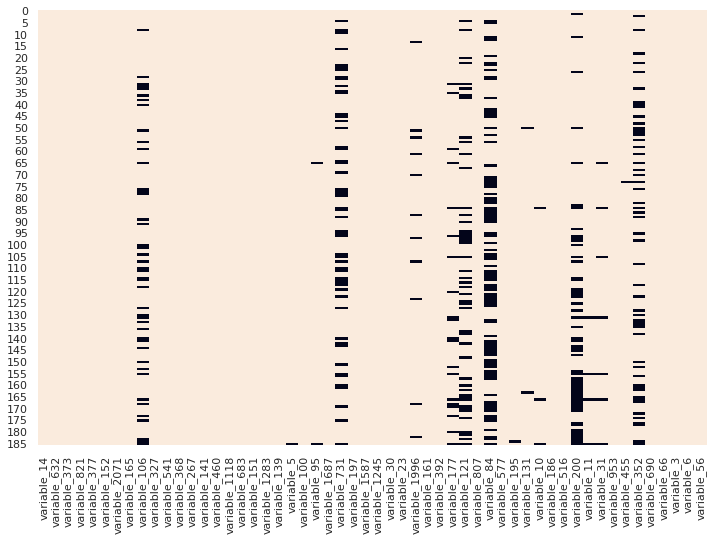

In [242]:
plt.figure(figsize=(12,8))
sns.heatmap(X[subset_variable_identification_variables].notna(), cbar=False);

In [243]:
subset_variable_identification.to_csv(pwd + 
                                      'data/identification/subset_original_one_row_per_compound_all_columns.csv',
                                      header=True, index=False)

#### Explore values for columns of isotopes and adducts

#### Isotopes :

In [209]:
pd.DataFrame([re.sub(r'\[[0-9]+\]', '', index)\
 for index in variable_identification['xcmsCamera_isotopes']
              [variable_identification['xcmsCamera_isotopes'].notna()]]).value_counts()

[M]+      113
[M+1]+     91
[M+2]+     25
[M+3]+     13
[M+4]+      3
dtype: int64

In [210]:
variable_identification[variable_identification['xcmsCamera_isotopes'].str.contains('\[M\]+', na=False)]

,variableMetadata,parentMZ,parentRT,Score,MonoisotopicMass,SMILES,InChIKey,Name,NoExplPeaks,NumberPeaksUsed,...,xcmsCamera_mzmin,xcmsCamera_mzmax,xcmsCamera_rt,xcmsCamera_rtmin,xcmsCamera_rtmax,xcmsCamera_npeaks,xcmsCamera_isotopes,xcmsCamera_adduct,xcmsCamera_pcgroup,imputed
2,variable_6,140.0682,304.407,2.000000,117.078979,NCCCCC(O)=O,JJMDCOVWQOJGCB-UHFFFAOYSA-N,delta-Aminovaleric acid,115,287,...,64.015582,64.016015,299.3860,195.740,317.234,272,[1][M]+,NaN,22,yes
7,variable_14,76.0757,232.379,2.000000,75.068414,CC(O)CN,HXKKHQJGJAFBHI-UHFFFAOYSA-N,1-Amino-2-propanol,141,789,...,76.075408,76.075809,232.4145,231.656,233.473,212,[2][M]+,[M+H]+ 75.0684,51,No
27,variable_87,116.0708,308.810,2.000000,115.063329,OC(=O)[C@@H]1CCCN1,ONIBWKKTOPOVIA-BYPYZUCNSA-N,Proline,117,466,...,116.070509,116.070923,308.5350,296.346,309.449,223,[11][M]+,NaN,15,No
29,variable_93,72.0808,304.796,2.000000,71.073499,C1CCNC1,RWRDLPDLKQPQOW-UHFFFAOYSA-N,Pyrrolidine,101,249,...,118.086041,118.086542,305.4860,291.526,365.847,244,[12][M]+,NaN,35,yes
30,variable_95,142.0863,138.261,1.991109,124.052429,COC1=C(O)C=CC=C1,LHGVFZTZFXWLCP-UHFFFAOYSA-N,Guaiacol,187,353,...,118.122134,118.122806,132.0625,59.191,179.929,338,[14][M]+,NaN,70,yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
508,variable_2195,155.1184,44.205,2.000000,137.084064,NCCC1=CC=C(O)C=C1,DZGWFCGJZKJUFP-UHFFFAOYSA-N,Tyramine,77,167,...,846.444534,846.446844,41.9665,41.015,42.402,212,[304][M]+,[M+NH4]+ 828.411,5,yes
515,variable_2206,155.1184,44.205,2.000000,137.084064,NCCC1=CC=C(O)C=C1,DZGWFCGJZKJUFP-UHFFFAOYSA-N,Tyramine,77,167,...,851.396858,851.400361,41.8440,41.015,42.272,213,[306][M]+,[M+Na]+ 828.411,5,yes
519,variable_2218,155.1184,44.205,2.000000,137.084064,NCCC1=CC=C(O)C=C1,DZGWFCGJZKJUFP-UHFFFAOYSA-N,Tyramine,77,167,...,867.373822,867.376314,41.9610,41.015,42.272,212,[308][M]+,[M+K]+ 828.411,5,yes
526,variable_2229,155.1184,44.205,2.000000,137.084064,NCCC1=CC=C(O)C=C1,DZGWFCGJZKJUFP-UHFFFAOYSA-N,Tyramine,77,167,...,873.451445,873.454582,42.1870,41.624,42.872,213,[309][M]+,NaN,5,yes


#### Adducts :

In [211]:
pd.DataFrame([re.sub(r'[0-9]+', '', index)\
 for index in variable_identification['xcmsCamera_adduct']
              [variable_identification['xcmsCamera_adduct'].notna()]]).value_counts()

[M+H]+ .                                 66
[M+K]+ .                                 53
[M+Na]+ .                                45
[M+NH]+ .                                31
[M+K]+ . [M+H]+ .                         5
[M+Na]+ . [M+H]+ .                        5
[M+K]+ . [M+Na]+ .                        3
[M+NH]+ . [M+H]+ .                        3
[M+K]+ . [M+NH]+ .                        2
[M+K]+ . [M+Na]+ . [M+NH]+ . [M+H]+ .     1
[M+Na]+ . [M+NH]+ .                       1
dtype: int64

In [212]:
variable_identification[variable_identification['xcmsCamera_adduct'].notna()]

,variableMetadata,parentMZ,parentRT,Score,MonoisotopicMass,SMILES,InChIKey,Name,NoExplPeaks,NumberPeaksUsed,...,xcmsCamera_mzmin,xcmsCamera_mzmax,xcmsCamera_rt,xcmsCamera_rtmin,xcmsCamera_rtmax,xcmsCamera_npeaks,xcmsCamera_isotopes,xcmsCamera_adduct,xcmsCamera_pcgroup,imputed
7,variable_14,76.0757,232.379,2.0,75.068414,CC(O)CN,HXKKHQJGJAFBHI-UHFFFAOYSA-N,1-Amino-2-propanol,141,789,...,76.075408,76.075809,232.4145,231.656,233.473,212,[2][M]+,[M+H]+ 75.0684,51,No
45,variable_139,132.0771,354.176,2.0,131.069477,CN(CC(O)=O)C(N)=N,CVSVTCORWBXHQV-UHFFFAOYSA-N,Creatine,136,422,...,132.076410,132.077071,354.8500,354.212,355.521,211,[17][M]+,[M+H]+ 131.07,41,No
52,variable_152,290.1605,121.863,2.0,289.152537,CC(CC([O-])=O)CC(=O)OC(CC(O)=O)C[N+](C)(C)C,HFCPFJNSBPQJDP-UHFFFAOYSA-N,3-Methylglutarylcarnitine,436,1529,...,135.002498,135.002886,176.1335,173.812,178.693,210,NaN,[M+Na]+ 112.013,119,yes
56,variable_159,137.0462,134.872,2.0,136.038511,OC1=NC=NC2=C1NC=N2,FDGQSTZJBFJUBT-UHFFFAOYSA-N,Hypoxanthine,147,270,...,137.045476,137.046915,135.4380,83.628,136.378,212,[21][M]+,[M+H]+ 136.039,24,No
59,variable_162,137.0462,134.872,2.0,136.038511,OC1=NC=NC2=C1NC=N2,FDGQSTZJBFJUBT-UHFFFAOYSA-N,Hypoxanthine,147,270,...,138.048327,138.049370,135.4390,133.741,136.378,209,[21][M+1]+,[M+H]+ 137.041,24,yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
542,variable_2327,286.2019,131.520,2.0,285.194008,CCCCC\C=C\C(=O)O[C@@H](CC([O-])=O)C[N+](C)(C)C,LOSHAHDSFZXVCT-LXKVQUBZSA-N,Octenoylcarnitine,288,830,...,1043.701085,1043.704929,142.7520,140.915,143.395,140,[319][M]+,[M+H]+ 1042.7,12,yes
546,variable_2334,582.2960,140.235,2.0,543.332489,CCCCC\C=C/C\C=C/C\C=C/C\C=C/CCCC(=O)OC[C@@H](O...,LAXQYRRMGGEGOH-JXRLJXCWSA-N,Lysophosphatidylcholine C20:4,216,985,...,1047.731083,1047.735342,140.9180,139.116,141.426,130,NaN,[M+H]+ 1046.73,14,yes
547,variable_2339,288.2907,58.514,2.0,270.255880,CCCCCCCCCCCCCCCCC(O)=O,KEMQGTRYUADPNZ-UHFFFAOYSA-N,Margaric acid (17:0),136,392,...,1057.523700,1057.528488,62.9060,61.711,63.585,150,NaN,[M+Na]+ 1034.52 [M+H]+ 1056.53,10,yes
548,variable_2340,288.2907,58.514,2.0,270.255880,CCCCCCCCCCCCCCCCC(O)=O,KEMQGTRYUADPNZ-UHFFFAOYSA-N,Margaric acid (17:0),136,392,...,1058.026171,1058.031037,62.9080,62.039,63.585,120,NaN,[M+Na]+ 1035.02,10,yes


### Explore significant features determined with the statistical test

In [214]:
print(f'With the statistical tests, we identified {subset_X.shape[1]} significant features :')
list(subset_X.columns)

With the statistical tests, we identified 14 significant features :


['variable_455',
 'variable_1224',
 'variable_1582',
 'variable_1587',
 'variable_1667',
 'variable_1674',
 'variable_1681',
 'variable_1800',
 'variable_2013',
 'variable_2141',
 'variable_2167',
 'variable_2175',
 'variable_2176',
 'variable_2196']

Below we subset the variable identification table from *metaboigniter* with only the significant features.

In [215]:
subset_variable_identification_signif = variable_identification[variable_identification['variableMetadata'].isin(subset_X)]
subset_variable_identification_signif

,variableMetadata,parentMZ,parentRT,Score,MonoisotopicMass,SMILES,InChIKey,Name,NoExplPeaks,NumberPeaksUsed,...,xcmsCamera_mzmin,xcmsCamera_mzmax,xcmsCamera_rt,xcmsCamera_rtmin,xcmsCamera_rtmax,xcmsCamera_npeaks,xcmsCamera_isotopes,xcmsCamera_adduct,xcmsCamera_pcgroup,imputed
150,variable_455,126.0218,320.463,2.000000,125.014664,NCCS(O)(=O)=O,XOAAWQZATWQOTB-UHFFFAOYSA-N,Taurine,43,192,...,203.138880,203.139850,319.5000,318.821,320.108,209,NaN,NaN,104,yes
310,variable_1224,142.0863,138.261,1.991109,124.052429,COC1=C(O)C=CC=C1,LHGVFZTZFXWLCP-UHFFFAOYSA-N,Guaiacol,187,353,...,393.161314,393.165744,132.3910,130.754,173.876,156,NaN,NaN,70,yes
385,variable_1582,286.2019,131.520,2.000000,285.194008,CCCCC\C=C\C(=O)O[C@@H](CC([O-])=O)C[N+](C)(C)C,LOSHAHDSFZXVCT-LXKVQUBZSA-N,Octenoylcarnitine,288,830,...,522.356107,522.357371,142.7520,127.406,143.968,270,[203][M]+,[M+H]+ 521.349,12,yes
387,variable_1587,582.2960,140.235,2.000000,543.332489,CCCCC\C=C/C\C=C/C\C=C/C\C=C/CCCC(=O)OC[C@@H](O...,LAXQYRRMGGEGOH-JXRLJXCWSA-N,Lysophosphatidylcholine C20:4,216,985,...,524.371161,524.372784,140.3160,124.219,141.426,319,[205][M]+,[M+H]+ 523.365,14,yes
399,variable_1667,544.3405,142.010,2.000000,543.332489,CCCCC\C=C/C\C=C/C\C=C/C\C=C/CCCC(=O)OC[C@@H](O...,LAXQYRRMGGEGOH-JXRLJXCWSA-N,Lysophosphatidylcholine C20:4,108,363,...,544.339066,544.341876,139.4625,123.620,140.807,324,[218][M]+,[M+H]+ 543.333,14,No
401,variable_1674,582.2960,140.235,2.000000,543.332489,CCCCC\C=C/C\C=C/C\C=C/C\C=C/CCCC(=O)OC[C@@H](O...,LAXQYRRMGGEGOH-JXRLJXCWSA-N,Lysophosphatidylcholine C20:4,216,985,...,546.353747,546.356612,140.3150,124.219,140.990,221,[218][M+2]+,[M+Na]+ 523.365,14,yes
403,variable_1681,582.2960,140.235,2.000000,543.332489,CCCCC\C=C/C\C=C/C\C=C/C\C=C/CCCC(=O)OC[C@@H](O...,LAXQYRRMGGEGOH-JXRLJXCWSA-N,Lysophosphatidylcholine C20:4,216,985,...,548.364603,548.368579,139.7030,124.442,140.381,211,[218][M+4]+,[M+Na]+ 525.371,14,yes
439,variable_1800,582.2960,140.235,2.000000,543.332489,CCCCC\C=C/C\C=C/C\C=C/C\C=C/CCCC(=O)OC[C@@H](O...,LAXQYRRMGGEGOH-JXRLJXCWSA-N,Lysophosphatidylcholine C20:4,216,985,...,602.344920,602.348579,140.8840,138.517,141.536,198,NaN,[M+NH4]+ 584.309,14,yes
460,variable_2013,729.5907,102.910,2.000000,728.583225,[H][C@@](COP([O-])(=O)OCC[N+](C)(C)C)(NC(=O)CC...,NELGJAUZKNHZLS-NUIAMLAYSA-N,Sphingomyelin (d18:2/18:0),203,1304,...,729.586986,729.591014,104.9590,103.487,105.553,193,NaN,NaN,28,No
482,variable_2141,185.1292,66.808,2.000000,167.094629,COC1=C(O)C=CC(CCN)=C1,DIVQKHQLANKJQO-UHFFFAOYSA-N,3-O-Methyldopamine,62,136,...,804.551100,804.554637,65.9680,65.408,66.748,210,[297][M]+,[M+Na]+ 781.564,17,yes


In [220]:
subset_variable_identification_signif.to_csv(pwd + 'data/significant_compounds_after_exploration/compounds_significant_infos_all_columns.csv', header=True, index=False)

In [216]:
variable_identification.columns

Index(['variableMetadata', 'parentMZ', 'parentRT', 'Score', 'MonoisotopicMass',
       'SMILES', 'InChIKey', 'Name', 'NoExplPeaks', 'NumberPeaksUsed', 'InChI',
       'OfflineMetFusionScore', 'MaximumTreeDepth', 'Identifier', 'ExplPeaks',
       'InChIKey3', 'InChIKey2', 'InChIKey1', 'FragmenterScore',
       'MolecularFormula', 'FragmenterScore_Values', 'FormulasOfExplPeaks',
       'q.value', 'xcmsCamera_mz', 'xcmsCamera_mzmin', 'xcmsCamera_mzmax',
       'xcmsCamera_rt', 'xcmsCamera_rtmin', 'xcmsCamera_rtmax',
       'xcmsCamera_npeaks', 'xcmsCamera_isotopes', 'xcmsCamera_adduct',
       'xcmsCamera_pcgroup', 'imputed'],
      dtype='object')

Here we keep only relevant columns for further analysis.

In [217]:
subset_variable_signif_infos = subset_variable_identification_signif[['variableMetadata', 'MonoisotopicMass', 'SMILES', 'InChIKey', 'Name', 'InChI', 'Identifier']]
subset_variable_signif_infos

,variableMetadata,MonoisotopicMass,SMILES,InChIKey,Name,InChI,Identifier
150,variable_455,125.014664,NCCS(O)(=O)=O,XOAAWQZATWQOTB-UHFFFAOYSA-N,Taurine,"InChI=1S/C2H7NO3S/c3-1-2-7(4,5)6/h1-3H2,(H,4,5,6)",HMDB0000251
310,variable_1224,124.052429,COC1=C(O)C=CC=C1,LHGVFZTZFXWLCP-UHFFFAOYSA-N,Guaiacol,"InChI=1S/C7H8O2/c1-9-7-5-3-2-4-6(7)8/h2-5,8H,1H3",HMDB0001398
385,variable_1582,285.194008,CCCCC\C=C\C(=O)O[C@@H](CC([O-])=O)C[N+](C)(C)C,LOSHAHDSFZXVCT-LXKVQUBZSA-N,Octenoylcarnitine,InChI=1S/C15H27NO4/c1-5-6-7-8-9-10-15(19)20-13...,HMDB0013324
387,variable_1587,543.332489,CCCCC\C=C/C\C=C/C\C=C/C\C=C/CCCC(=O)OC[C@@H](O...,LAXQYRRMGGEGOH-JXRLJXCWSA-N,Lysophosphatidylcholine C20:4,InChI=1S/C28H50NO7P/c1-5-6-7-8-9-10-11-12-13-1...,HMDB0010395
399,variable_1667,543.332489,CCCCC\C=C/C\C=C/C\C=C/C\C=C/CCCC(=O)OC[C@@H](O...,LAXQYRRMGGEGOH-JXRLJXCWSA-N,Lysophosphatidylcholine C20:4,InChI=1S/C28H50NO7P/c1-5-6-7-8-9-10-11-12-13-1...,HMDB0010395
401,variable_1674,543.332489,CCCCC\C=C/C\C=C/C\C=C/C\C=C/CCCC(=O)OC[C@@H](O...,LAXQYRRMGGEGOH-JXRLJXCWSA-N,Lysophosphatidylcholine C20:4,InChI=1S/C28H50NO7P/c1-5-6-7-8-9-10-11-12-13-1...,HMDB0010395
403,variable_1681,543.332489,CCCCC\C=C/C\C=C/C\C=C/C\C=C/CCCC(=O)OC[C@@H](O...,LAXQYRRMGGEGOH-JXRLJXCWSA-N,Lysophosphatidylcholine C20:4,InChI=1S/C28H50NO7P/c1-5-6-7-8-9-10-11-12-13-1...,HMDB0010395
439,variable_1800,543.332489,CCCCC\C=C/C\C=C/C\C=C/C\C=C/CCCC(=O)OC[C@@H](O...,LAXQYRRMGGEGOH-JXRLJXCWSA-N,Lysophosphatidylcholine C20:4,InChI=1S/C28H50NO7P/c1-5-6-7-8-9-10-11-12-13-1...,HMDB0010395
460,variable_2013,728.583225,[H][C@@](COP([O-])(=O)OCC[N+](C)(C)C)(NC(=O)CC...,NELGJAUZKNHZLS-NUIAMLAYSA-N,Sphingomyelin (d18:2/18:0),InChI=1S/C41H81N2O6P/c1-6-8-10-12-14-16-18-20-...,HMDB0240631
482,variable_2141,167.094629,COC1=C(O)C=CC(CCN)=C1,DIVQKHQLANKJQO-UHFFFAOYSA-N,3-O-Methyldopamine,InChI=1S/C9H13NO2/c1-12-9-6-7(4-5-10)2-3-8(9)1...,HMDB0000022


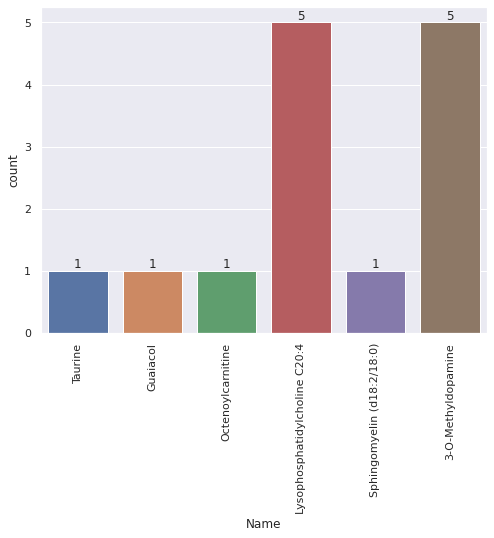

In [218]:
ax = sns.countplot(x='Name', data=subset_variable_signif_infos);
plt.xticks(rotation=90)
ax.bar_label(ax.containers[0]);

In [219]:
subset_variable_signif_infos.to_csv(pwd + 'data/significant_compounds_after_exploration/compounds_significant_infos_relevant_columns.csv', header=True, index=False)

We can observe that some variables correspond to the same compounds.

For example, we can explore the variables corresponding to the compound *Lysophosphatidylcholine C20:4* :

In [221]:
list_variable_lyso = list(subset_variable_signif_infos[subset_variable_signif_infos['Name'] == 'Lysophosphatidylcholine C20:4']
                          ['variableMetadata'].values)
list_variable_lyso

['variable_1587',
 'variable_1667',
 'variable_1674',
 'variable_1681',
 'variable_1800']

In [222]:
X[list_variable_lyso]

,variable_1587,variable_1667,variable_1674,variable_1681,variable_1800
0,22.727159,21.323783,20.524991,16.718552,14.323164
1,22.852766,21.976711,20.288004,17.138026,14.460135
2,22.141968,20.243623,19.234748,15.876230,13.621373
3,22.946740,20.919862,20.295436,16.846700,14.624331
4,22.107158,19.791554,19.077569,15.802826,13.769721
...,...,...,...,...,...
181,22.543090,21.756619,20.527349,16.760570,12.753340
182,22.059927,20.736121,19.839717,16.096347,12.700758
183,22.218538,20.888653,19.858358,16.002179,12.678920
184,22.113462,20.669607,19.402183,15.879798,12.772960


Below we can see the correlations between each of the features corresponding to *Lysophosphatidylcholine C20:4* :

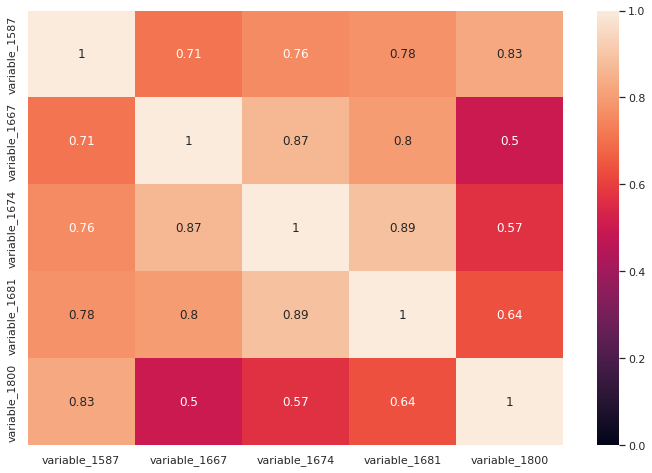

In [223]:
plt.figure(figsize=(12,8))
sns.heatmap(X[list_variable_lyso].corr(),
            annot=True, fmt='.2g', vmin=0, vmax=1);

And here is the list of all the compounds corresponding to significant features :

In [224]:
list(np.unique(variable_identification[variable_identification['variableMetadata'].isin(subset_X)]['Name']))

['3-O-Methyldopamine',
 'Guaiacol',
 'Lysophosphatidylcholine C20:4',
 'Octenoylcarnitine',
 'Sphingomyelin (d18:2/18:0)',
 'Taurine']

### For each significant compound, we only keep the column (variable) with the minimum number of missing values  

In [225]:
comp_signif = variable_identification[variable_identification['variableMetadata'].isin(test_result4[test_result4['H0rejectedCorrected'] == True].index)]
variables_to_keep = []
for compound in np.unique(comp_signif['Name']):
    variables = comp_signif[comp_signif['Name'] == compound]['variableMetadata'].values
    variables_to_keep.append(X[variables].isna().sum().idxmin())
variables_to_keep

['variable_2141',
 'variable_1224',
 'variable_1587',
 'variable_1582',
 'variable_2013',
 'variable_455']

In [226]:
comp_signif_var_name = comp_signif[comp_signif['variableMetadata'].isin(variables_to_keep)][['variableMetadata', 'Name']]
comp_signif_var_name

,variableMetadata,Name
150,variable_455,Taurine
310,variable_1224,Guaiacol
385,variable_1582,Octenoylcarnitine
387,variable_1587,Lysophosphatidylcholine C20:4
460,variable_2013,Sphingomyelin (d18:2/18:0)
482,variable_2141,3-O-Methyldopamine


In [227]:
significant_variable = subset_variable_infos[subset_variable_infos['variableMetadata'].isin(variables_to_keep)]
significant_variable

,variableMetadata,MonoisotopicMass,SMILES,InChIKey,Name,InChI,Identifier
150,variable_455,125.014664,NCCS(O)(=O)=O,XOAAWQZATWQOTB-UHFFFAOYSA-N,Taurine,"InChI=1S/C2H7NO3S/c3-1-2-7(4,5)6/h1-3H2,(H,4,5,6)",HMDB0000251
310,variable_1224,124.052429,COC1=C(O)C=CC=C1,LHGVFZTZFXWLCP-UHFFFAOYSA-N,Guaiacol,"InChI=1S/C7H8O2/c1-9-7-5-3-2-4-6(7)8/h2-5,8H,1H3",HMDB0001398
385,variable_1582,285.194008,CCCCC\C=C\C(=O)O[C@@H](CC([O-])=O)C[N+](C)(C)C,LOSHAHDSFZXVCT-LXKVQUBZSA-N,Octenoylcarnitine,InChI=1S/C15H27NO4/c1-5-6-7-8-9-10-15(19)20-13...,HMDB0013324
387,variable_1587,543.332489,CCCCC\C=C/C\C=C/C\C=C/C\C=C/CCCC(=O)OC[C@@H](O...,LAXQYRRMGGEGOH-JXRLJXCWSA-N,Lysophosphatidylcholine C20:4,InChI=1S/C28H50NO7P/c1-5-6-7-8-9-10-11-12-13-1...,HMDB0010395
460,variable_2013,728.583225,[H][C@@](COP([O-])(=O)OCC[N+](C)(C)C)(NC(=O)CC...,NELGJAUZKNHZLS-NUIAMLAYSA-N,Sphingomyelin (d18:2/18:0),InChI=1S/C41H81N2O6P/c1-6-8-10-12-14-16-18-20-...,HMDB0240631
482,variable_2141,167.094629,COC1=C(O)C=CC(CCN)=C1,DIVQKHQLANKJQO-UHFFFAOYSA-N,3-O-Methyldopamine,InChI=1S/C9H13NO2/c1-12-9-6-7(4-5-10)2-3-8(9)1...,HMDB0000022


In [228]:
significant_variable.to_csv(pwd + 'data/significant_compounds_after_exploration/compounds_significant_infos_relevant_columns_one_variable.csv', header=True, index=False)

### Below is the pattern of missing values for the variables that we kept

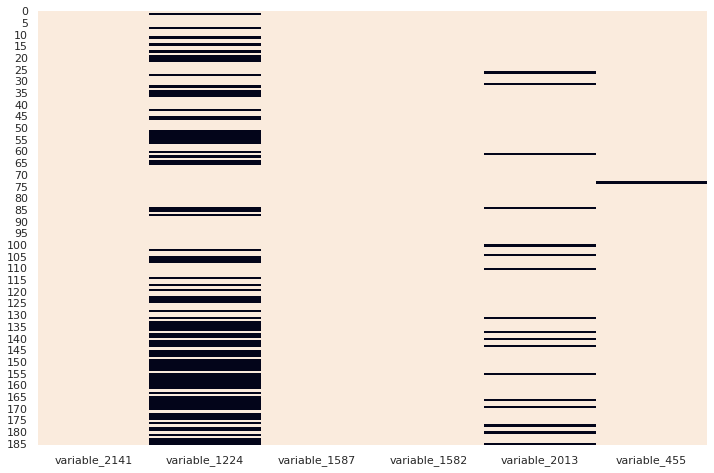

In [229]:
plt.figure(figsize=(12,8))
sns.heatmap(X[variables_to_keep].notna(), cbar=False);

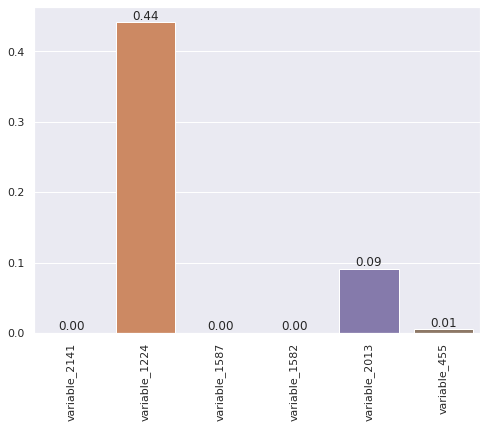

In [230]:
ax = sns.barplot(x=(X[variables_to_keep].isna().sum()/len(X[variables_to_keep])).index,
                 y=(X[variables_to_keep].isna().sum()/len(X[variables_to_keep])).values);
plt.xticks(rotation=90)
ax.bar_label(ax.containers[0], fmt='%.2f');

It would be better for further analysis to keep only features with less than a certain percent of missing value.

### Below we can see the variable distributions and boxplots corresponding to the TypTumo, for the variables we kept just before

In [231]:
comp_signif_var_name

,variableMetadata,Name
150,variable_455,Taurine
310,variable_1224,Guaiacol
385,variable_1582,Octenoylcarnitine
387,variable_1587,Lysophosphatidylcholine C20:4
460,variable_2013,Sphingomyelin (d18:2/18:0)
482,variable_2141,3-O-Methyldopamine


In [232]:
X[variables_to_keep]

,variable_2141,variable_1224,variable_1587,variable_1582,variable_2013,variable_455
0,15.986642,11.776399,22.727159,23.193580,13.973290,14.901102
1,16.890236,NaN,22.852766,23.309319,13.532489,13.742697
2,16.150009,12.889435,22.141968,22.140140,13.701981,14.248796
3,15.888334,12.406618,22.946740,23.152943,13.764644,14.237655
4,15.201124,13.183449,22.107158,22.374462,12.445936,15.256830
...,...,...,...,...,...,...
181,15.012310,NaN,22.543090,22.715137,13.285125,13.694057
182,14.881942,11.859027,22.059927,22.528103,12.951560,15.459569
183,15.498081,NaN,22.218538,22.761386,13.149555,15.456830
184,14.866505,NaN,22.113462,22.050695,12.779032,14.275241


------------------------------------------------------------------------------------------------------------------------


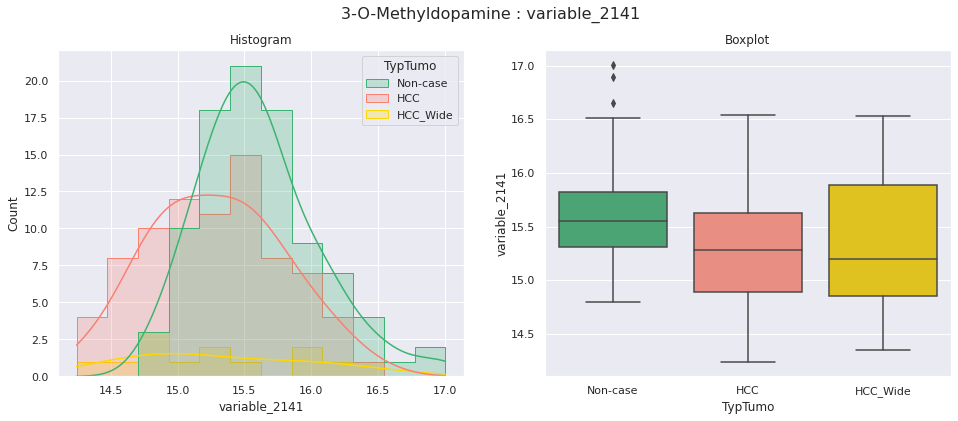

------------------------------------------------------------------------------------------------------------------------


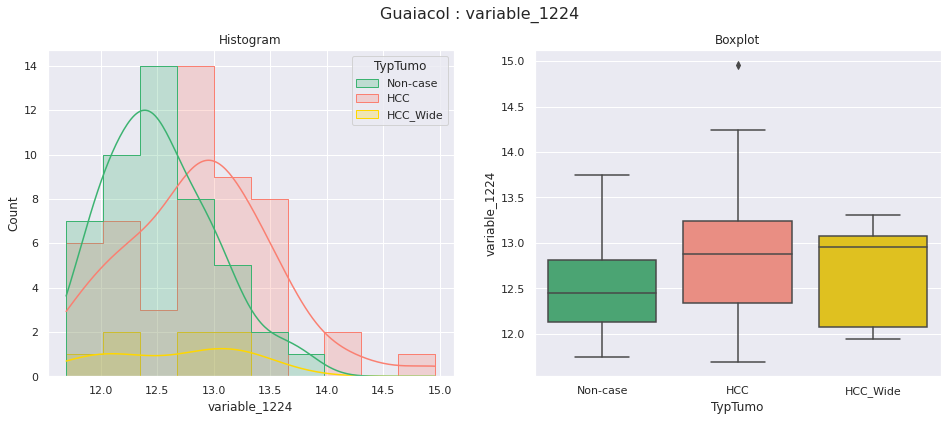

------------------------------------------------------------------------------------------------------------------------


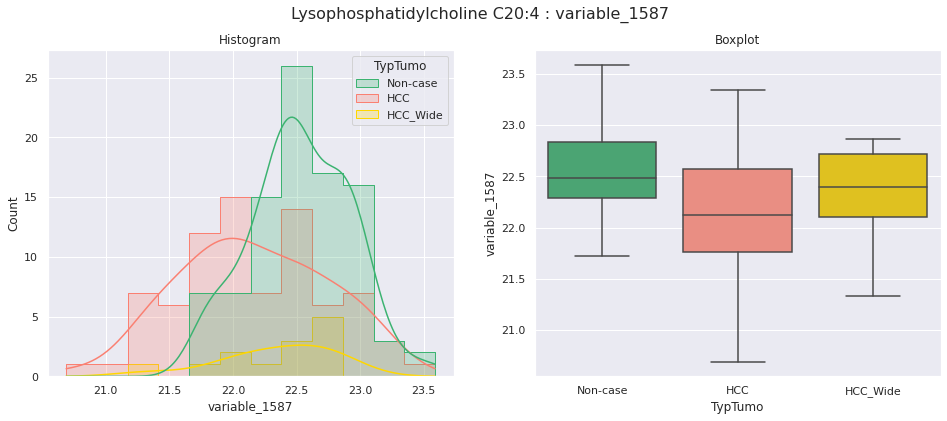

------------------------------------------------------------------------------------------------------------------------


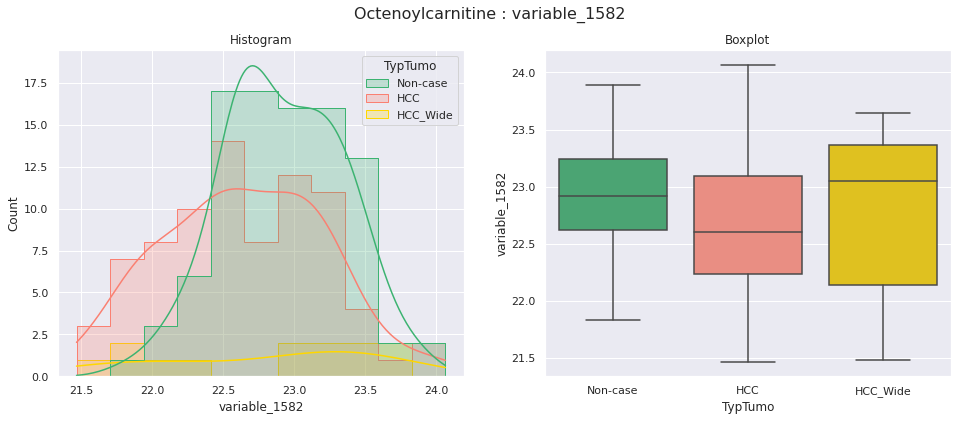

------------------------------------------------------------------------------------------------------------------------


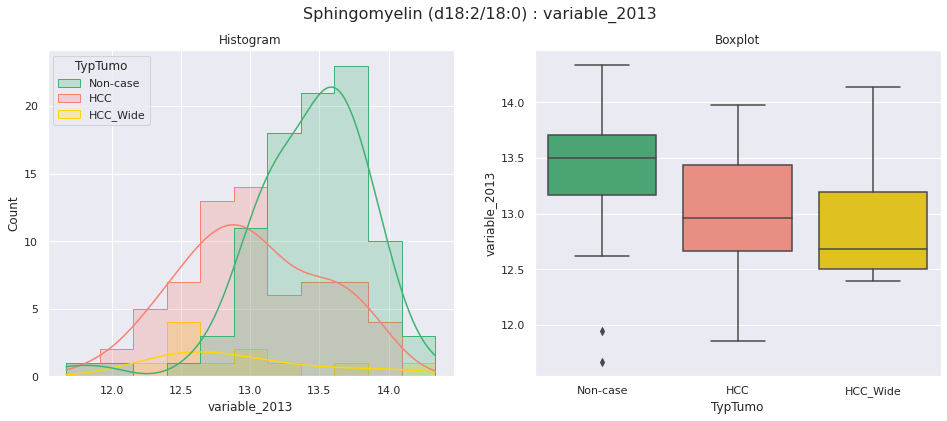

------------------------------------------------------------------------------------------------------------------------


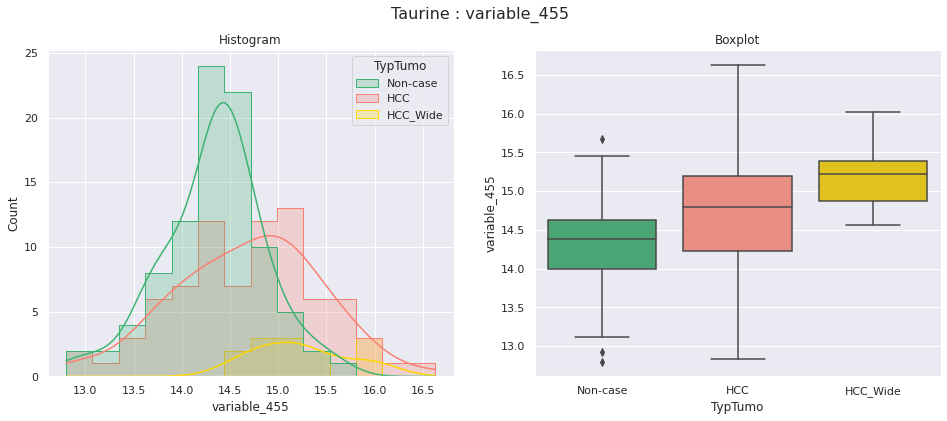

In [233]:
palette = {'Non-case': 'mediumseagreen', 'HCC': 'salmon', 'HCC_Wide': 'gold'}

for col in X[variables_to_keep]:
    
    plt.figure(figsize=(16, 6))
    plt.subplot(1, 2, 1)
    sns.histplot(data=peakTable_copy, x=peakTable_copy[col], hue='TypTumo', hue_order=['Non-case', 'HCC', 'HCC_Wide'], kde=True, element='step', palette=palette)
    plt.title('Histogram')
    
    plt.subplot(1, 2, 2)
    sns.boxplot(x='TypTumo', y=col, data=peakTable_copy, order=['Non-case', 'HCC', 'HCC_Wide'], palette=palette)
    plt.title('Boxplot')
    
    compound = comp_signif_var_name[comp_signif_var_name['variableMetadata'] == col]
    plt.suptitle(f'{compound.iloc[0]["Name"]} : {col}', fontsize=16)
    
    print(120 * '-')
    
    plt.show()

# Save subset data with only significant variables

In [234]:
metadata = peakTable.iloc[:, ['variable' not in col for col in peakTable.columns]]
metadata

,SampleID,Groups,MatchCaseset,TypTumo,CaseHCCWide,EPICID,EPICBioID,AliquotID
0,LivCan_153,Incident,82,HCC,Yes,41____41041872,41____41041872,41041872-s2#C
1,LivCan_154,Non-case,82,NaN,No,41____41046868,41____41046868,41046868-s2#C
2,LivCan_267,Incident,427,HCC,Yes,41____41074588,41____41074588,41074588-s1#B
3,LivCan_268,Non-case,427,NaN,No,41____41089214,41____41089214,41089214-s1#B
4,LivCan_299,Incident,376,HCC_Wide,Yes,21____21103888,21____21103888,21103888-s1#B
...,...,...,...,...,...,...,...,...
181,LivCan_080,Non-case,56,NaN,No,32____3208004E,32____32253231,32253231-s3#C
182,LivCan_375,Incident,383,HCC,Yes,22____22281416,22____22281416,22281416-s1#B
183,LivCan_376,Non-case,383,NaN,No,22____22281701,22____22281701,22281701-s1#B
184,LivCan_165,Incident,147,HCC,Yes,71____71000825,71____71000065,71000065-s2#C


In [235]:
X_subset = X[variables_to_keep]
X_subset

,variable_2141,variable_1224,variable_1587,variable_1582,variable_2013,variable_455
0,15.986642,11.776399,22.727159,23.193580,13.973290,14.901102
1,16.890236,NaN,22.852766,23.309319,13.532489,13.742697
2,16.150009,12.889435,22.141968,22.140140,13.701981,14.248796
3,15.888334,12.406618,22.946740,23.152943,13.764644,14.237655
4,15.201124,13.183449,22.107158,22.374462,12.445936,15.256830
...,...,...,...,...,...,...
181,15.012310,NaN,22.543090,22.715137,13.285125,13.694057
182,14.881942,11.859027,22.059927,22.528103,12.951560,15.459569
183,15.498081,NaN,22.218538,22.761386,13.149555,15.456830
184,14.866505,NaN,22.113462,22.050695,12.779032,14.275241


In [236]:
peakTable_subset = pd.concat([metadata, X_subset], axis=1)
peakTable_subset

,SampleID,Groups,MatchCaseset,TypTumo,CaseHCCWide,EPICID,EPICBioID,AliquotID,variable_2141,variable_1224,variable_1587,variable_1582,variable_2013,variable_455
0,LivCan_153,Incident,82,HCC,Yes,41____41041872,41____41041872,41041872-s2#C,15.986642,11.776399,22.727159,23.193580,13.973290,14.901102
1,LivCan_154,Non-case,82,NaN,No,41____41046868,41____41046868,41046868-s2#C,16.890236,NaN,22.852766,23.309319,13.532489,13.742697
2,LivCan_267,Incident,427,HCC,Yes,41____41074588,41____41074588,41074588-s1#B,16.150009,12.889435,22.141968,22.140140,13.701981,14.248796
3,LivCan_268,Non-case,427,NaN,No,41____41089214,41____41089214,41089214-s1#B,15.888334,12.406618,22.946740,23.152943,13.764644,14.237655
4,LivCan_299,Incident,376,HCC_Wide,Yes,21____21103888,21____21103888,21103888-s1#B,15.201124,13.183449,22.107158,22.374462,12.445936,15.256830
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181,LivCan_080,Non-case,56,NaN,No,32____3208004E,32____32253231,32253231-s3#C,15.012310,NaN,22.543090,22.715137,13.285125,13.694057
182,LivCan_375,Incident,383,HCC,Yes,22____22281416,22____22281416,22281416-s1#B,14.881942,11.859027,22.059927,22.528103,12.951560,15.459569
183,LivCan_376,Non-case,383,NaN,No,22____22281701,22____22281701,22281701-s1#B,15.498081,NaN,22.218538,22.761386,13.149555,15.456830
184,LivCan_165,Incident,147,HCC,Yes,71____71000825,71____71000065,71000065-s2#C,14.866505,NaN,22.113462,22.050695,12.779032,14.275241


In [237]:
peakTable_subset.to_csv(pwd + 'data/peakTable/subset_peakTable/peakTable_subset.csv', header=True, index=False)

# Relative log abundance and Volcano plot will be used later on an imputed and normalised peak table !

## Relative log abundance

plt.figure(figsize=(20, 15))

plt.suptitle('Relative log abundance', fontsize=20)

plt.subplot(2, 1, 1)
rel_log_abundance_metabolite = np.log(X.iloc[:,:100]) - np.log(X.iloc[:,:100]).median()
boxplot = sns.boxplot(data=rel_log_abundance_metabolite)
boxplot.set_xticklabels(boxplot.get_xticklabels(), rotation=90)
plt.title('Based on metabolites', fontsize=16)

plt.subplot(2, 1, 2)
rel_log_abundance_sample = np.log(X) - np.array(np.log(X).median(axis=1)).reshape(X.median(axis=1).shape[0], 1)
boxplot = sns.boxplot(data=rel_log_abundance_sample.transpose())
boxplot.set_xticklabels(boxplot.get_xticklabels(), rotation=90)
plt.title('Based on samples', fontsize=16)

plt.subplots_adjust(hspace=0.4)
plt.show()

None

In [238]:
X.shape

(186, 337)

def plot_relative_log_abundance(X):
    
    plt.figure(figsize=(50, 30))

    plt.suptitle('Relative log abundance', fontsize=50)

    plt.subplot(2, 1, 1)
    plt.subplots_adjust(top=0.92)
    rel_log_abundance_metabolite = np.log(X) - np.log(X).median()
    
    xlabel_fontsize = min(3000/X.shape[1], 30)
    boxplot = sns.boxplot(data=rel_log_abundance_metabolite)
    boxplot.set_xticklabels(boxplot.get_xticklabels(), rotation=90, fontsize=xlabel_fontsize)
    plt.title('Based on metabolites', fontsize=40)
    
    plt.subplot(2, 1, 2)
    rel_log_abundance_sample = np.log(X) - np.array(np.log(X).median(axis=1)).reshape(X.median(axis=1).shape[0], 1)
    boxplot = sns.boxplot(data=rel_log_abundance_sample.transpose())
    boxplot.set_xticklabels(boxplot.get_xticklabels(), rotation=90, fontsize=18)
    plt.title('Based on samples', fontsize=40)

    plt.subplots_adjust(hspace=0.4)
    plt.show()


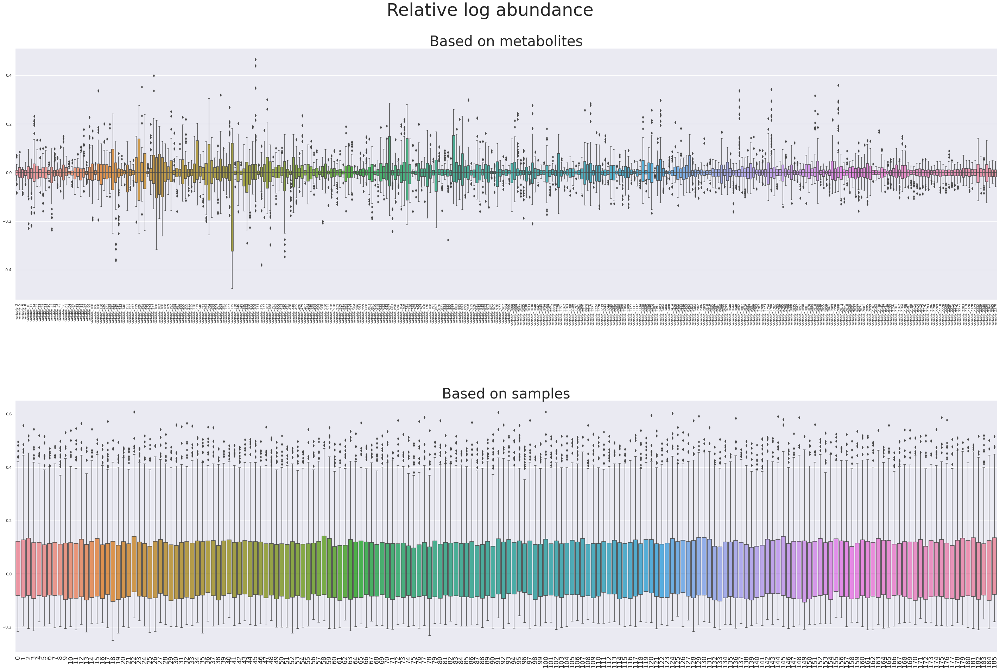

In [239]:
plot_relative_log_abundance(X)

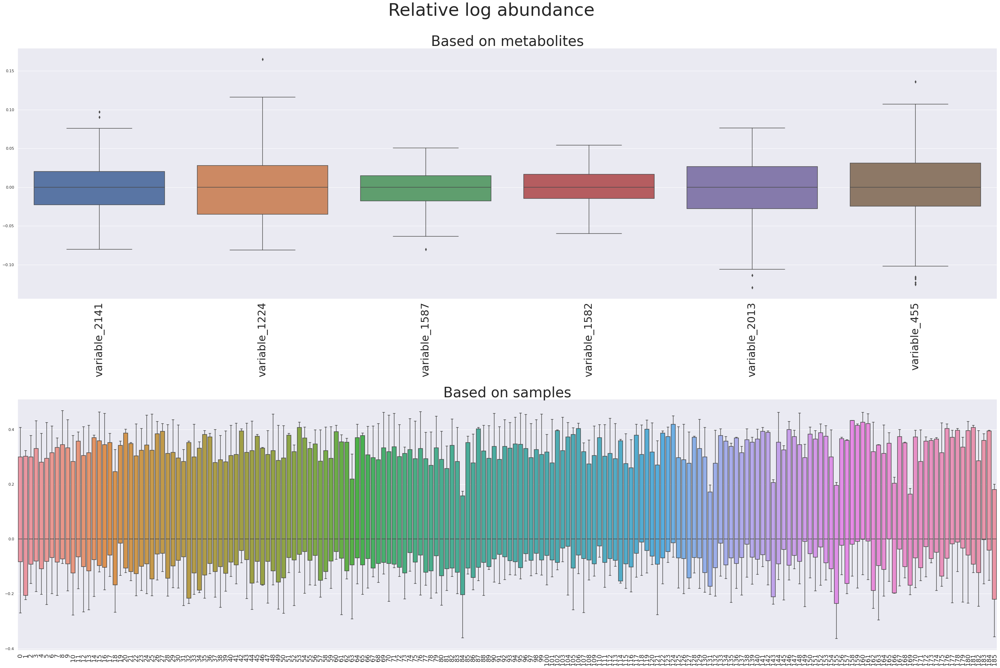

In [240]:
plot_relative_log_abundance(X_subset)

plt.figure(figsize=(20, 15))

plt.suptitle('Relative log abundance', fontsize=20)

plt.subplot(2, 1, 1)
rel_log_abundance_metabolite = np.log(X_subset) - np.log(X_subset).median()
boxplot = sns.boxplot(data=rel_log_abundance_metabolite)
boxplot.set_xticklabels(boxplot.get_xticklabels(), rotation=90)
plt.title('Based on metabolites', fontsize=16)

plt.subplot(2, 1, 2)
rel_log_abundance_sample = np.log(X_subset) - np.array(np.log(X_subset).median(axis=1)).reshape(X_subset.median(axis=1).shape[0], 1)
boxplot = sns.boxplot(data=rel_log_abundance_sample.transpose())
boxplot.set_xticklabels(boxplot.get_xticklabels(), rotation=90)
plt.title('Based on samples', fontsize=16)

plt.subplots_adjust(hspace=0.4)
plt.show()

None

## Use volcano plot to find significant variables

In [293]:
test_result

,NormallyDistributed,TestApplied,statistic,pvalue
Variable,,,,
variable_3,False,Wilcoxon,1270.000000,0.000452
variable_5,True,Paired t-test,2.644733,0.009630
variable_6,False,Wilcoxon,2082.000000,0.691685
variable_8,True,Paired t-test,-1.091111,0.280671
variable_10,True,Paired t-test,-1.994325,0.049177
...,...,...,...,...
variable_2340,True,Paired t-test,-0.059732,0.952666
variable_2350,True,Paired t-test,-0.091754,0.927432
variable_2364,True,Paired t-test,0.494443,0.623698
